<a href="https://colab.research.google.com/github/kodiakpony/datakit-housing-fall-2024/blob/main/challenge-3/DataKindHousingChallenge3Messy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook is very messy, sprawling, and not particularly coherent

It contains my investigations into the DataKind Fall 2024 DataKit Housing Challenge #3 "Getting Started" questions.

I took the best parts from my investigations here as the starting point for a better and more streamlined analysis in a [different notebeook](https://github.com/kodiakpony/datakit-housing-fall-2024/tree/main/challenge-3/DataKindHousingChallenge3Messy.ipynb). But I'm keeping this one, too, because there are still useful things amidst the mess that didn't make the cut for the better writeup.

I strongly advise looking at this notebook in Google Colab, so that you can easily collapse the sections you are not interested in to make the whole thing more manageable to wade through. Colab also lets you view a table of contents and jump to the section you are interested in.  Also, the plotly interactive graphs work in Colab.

This notebook's sections are:
* Background
* Setup
** setup primary dataframe
** CDFI loan dataset setup and initial analysis
** more setup, for venn diagrams / overlap
* Getting Started Analysis
** Num Mortgages
** CDFI Lending
** A detour into the CDFI LAR dataset again
** Do the Geographies for these Programs overlap?
** - Cross-Tabulations
** - Venn Diagrams
** How do populations vary by program?
** - Distribution Comparisons via Plotly Scatterpolar (including racial demographics and environmental risk factors)
** - Geospatial Visualizations (including Folium)
* Appendix
** TODO
** Newbie notes


I am comparing the census tracts that belong to the:
* the HUD Low Income Housing Tax Credit (LIHTC) program  
* HUD Opportunity Zones Program
* Dept of Treasury CDFI Fund Investment Areas

These are indicated by the following columns in the v1.0 dataset
* qct
* opzone
* investment_areas
* economic_distress_pop_agg

I look at mortgage originations and CDFI lending in census tracts, and end up spelunking into the source dataset for CDFI lending to better understand the enormous disparity in CDFI lending and why it appears unrelated to population or mortgages.

Then I look at the overlap in the sets of geoids belonging to each program, using cross tabulations and venn diagrams. And Folium marker and chloropleth maps in the geospatial visualizations section.

Then I start looking at population distributions within each set - racial demographics and environmental risks

I visualize these with interactive plotly radial plots, which seemed like a good idea at the time but don't seem to show up when viewing the file in GitHub, and I didn't really like them anyway. I do likely the interactivity of plotly graphs though.

This is using the updated (v1.1) DataKind dataset for this challenge, with about 5000 rows.

# Background

https://github.com/datakind/datakit-housing-fall-2024/discussions/3

https://www.epa.gov/ejscreen/ej-and-supplemental-indexes-ejscreen

Create an understanding of where affordable housing development is likely to be funded or otherwise incentivized. There are several federal government supported programs that offer financial support for affordable housing construction. Starting with three programs, the HUD Low Income Housing Tax Credit (LIHTC) program Qualified Census Tracts, the HUD Opportunity Zones Program Census Tracts, and the Dept of Treasury CDFI Fund Investment Areas. Data from these three programs is contained within the EODatascape. Using this data, create an understanding of housing construction opportunities for financial support at a Census tract level.

...

This “getting started” analysis should help answer the following questions:

* Do the geographies for these three programs overlap?
* Do the geographies align to high population density?
* Does the population breakdown shift by geography?
* Are the areas of incentive in areas of potential environmental hazard?
* Analysis insights and questions: What surprised you from this analysis? What are some limitations of the analysis? What are ways to extend the work?






# Setup

*Must execute this first so can run other code blocks!*


In [ ]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2,venn2_circles,venn3, venn3_circles, layout
import seaborn as sns
import zipfile
import requests, io
import plotly.express as px

import numpy as np
#import contextily as ctx
import geopandas as gpd
import os
import folium
from mpl_toolkits.axes_grid1 import make_axes_locatable


### setup primary dataframe

In [ ]:
# Read housing dataset into Panda dataframe df

url = 'https://github.com/datakind/datakit-housing-fall-2024/releases/download/v1.1/housing-data.zip'
#url = 'https://github.com/datakind/datakit-housing-fall-2024/releases/download/v1.0/housing-data.zip
#url = 'https://github.com/datakind/datakit-housing-fall-2024/releases/download/v1.0/housing-data.zip'
filename = "housing-data/FL/data_1-FL.csv"

r = requests.get(url)

with zipfile.ZipFile(io.BytesIO(r.content)) as myzip:
    with myzip.open(filename) as myfile:
        df = pd.read_csv(myfile)
df.head().T

,0,1,2,3,4
geoid,12001000600,12001000809,12001001100,12001001202,12001001519
geoid_year,2020,2020,2020,2020,2020
state,Florida,Florida,Florida,Florida,Florida
county,Alachua County,Alachua County,Alachua County,Alachua County,Alachua County
state_fips_code,12,12,12,12,12
...,...,...,...,...,...
fire_risk_30yr_share,49.0,46.0,0.0,7.0,0.0
fire_risk_30yr_pctile,85.852802,84.945254,2.453305,73.544119,2.453305
flood_risk_30yr_share,6.0,2.0,9.0,3.0,4.0
flood_risk_30yr_pctile,49.901048,19.444932,65.618596,31.81568,35.704667


In [ ]:
# Also, have to rename columns because the initial dataset used different names than the current one and I don't want to change everything

column_renames={
    "hud_opportunity_zones" : "opzone",
    "cdfi_fund_invest_areas" : "investment_areas",
    "lihtc_qualified_tracts" : "qct",
    "cdfi_fund_economic_distress" : "economic_distress_pop_agg",
    "county" : "county_name",
    "county_fips_code" : "county",
    "haz_waste_supp_pctile" : "haz_waste_prox_supp_pctile"
}
df=df.rename(columns=column_renames)

# make "cdfi_fund_invest_areas" a clone of "investment_areas"
df["cdfi_fund_invest_areas"]=df.investment_areas

# change "investment_areas" from YES/NO to 1/0,
df["investment_areas"]=df.investment_areas.apply(lambda x: 1 if x=="YES" else 0)



In [ ]:
# let's set a boolean column for whether a census tract has CDFI loans
df["has_cdfi_lending"]=df.total_cdfi_lending.apply(lambda x: x>1000)

pd.crosstab(df.investment_areas,df.has_cdfi_lending)

has_cdfi_lending,False,True
investment_areas,,
0,182,2164
1,58,2756


In [ ]:
df[df.cdfi_fund_invest_areas=='NO'].sort_values(by="total_cdfi_lending",ascending=False).loc[:,["geoid","geoid_year","state","county_name", "total_cdfi_lending"]].head(10)

,geoid,geoid_year,state,county_name,total_cdfi_lending
1577,12033000802,2020,Florida,Escambia County,3.553209e+07
2881,12033000801,2020,Florida,Escambia County,2.368806e+07
3923,12009063105,2020,Florida,Brevard County,2.004414e+07
1575,12033000100,2020,Florida,Escambia County,1.912955e+07
3877,12131950604,2020,Florida,Walton County,1.817132e+07
1259,12131950605,2020,Florida,Walton County,1.817132e+07
2544,12131950606,2020,Florida,Walton County,1.817132e+07
3879,12131950610,2020,Florida,Walton County,1.745877e+07
2442,12113010809,2020,Florida,Santa Rosa County,1.694613e+07
270,12033002500,2020,Florida,Escambia County,1.673818e+07


In [ ]:
# now let's read in the other dataset, which has population and number of households per census tract, which I pulled from census.gov
#path="https://github.com/kodiakpony/datakit-housing-fall-2024/tree/main/challenge-3/FL/DECENNIALDP2020.DP1_2024-10-12T222820/"
#file="DECENNIALDP2020.DP1-Data.csv"
url="https://raw.githubusercontent.com/kodiakpony/datakit-housing-fall-2024/refs/heads/main/challenge-3/FL/DECENNIALDP2020.DP1_2024-10-12T222820/DECENNIALDP2020.DP1-Data.csv"
#path+file
#r = requests.get(url)
#r.content

population_df_columns={
    "GEO_ID":"full_geoid",
    "NAME":"full_name",
    "DP1_0001C":"total_pop",
    "DP1_0132C":"total_households"
}

dfpop = pd.read_csv(url).loc[:,[*population_df_columns]].rename(columns=population_df_columns)
pop_descriptions=dfpop.iloc[0]
pop_florida_totals = dfpop.iloc[1]
dfpop.drop([0,1],inplace=True)
dfpop["geoid"]=dfpop["full_geoid"].apply(lambda x: x.split("US")[1]).astype(int)
dfpop.total_pop=dfpop.total_pop.astype(int)
dfpop.total_households=dfpop.total_households.astype(int)
dfpop.head()
#dfpop.dtypes

<ipython-input-6-5fcad38fc073>:16: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161) have mixed types. Specify dtype option on import or set low_memory=False.
  dfpop = pd.read_csv(url).loc[:,[*population_df_columns]].rename(columns=population_df_columns)


,full_geoid,full_name,total_pop,total_households,geoid
2,1400000US12001000201,Census Tract 2.01; Alachua County; Florida,4348,1711,12001000201
3,1400000US12001000202,Census Tract 2.02; Alachua County; Florida,4782,1695,12001000202
4,1400000US12001000301,Census Tract 3.01; Alachua County; Florida,3384,1808,12001000301
5,1400000US12001000302,Census Tract 3.02; Alachua County; Florida,2644,1257,12001000302
6,1400000US12001000400,Census Tract 4; Alachua County; Florida,5330,2117,12001000400


In [ ]:
display("merging population totals data into main dataframe")
display("dfpop shape:",dfpop.shape, "df shape: ",df.shape)
df=df.merge(dfpop,on="geoid",how="left")
display("merged df shape: ", df.shape)

'merging population totals data into main dataframe'

'dfpop shape:'

(5160, 5)

'df shape: '

(5160, 386)

'merged df shape: '

(5160, 390)

### CDFI loan dataset setup and initial analysis

This is a digression to look at the CDFI TLR dataset (Transaction Level Report), which is the source data for total cdfi lending in the EODataScape.

I dive into it much more in a different Colab notebook.

The puzzling thing here is why the sum of loans in the TLR dataset is so much smaller than the sum of CDFI lending in EODataSCape

In [ ]:
#let's also read in the dataset with more detail about CDFI loans, so we can better understand what is going on
# I downloaded this dataset from:
#   https://www.cdfifund.gov/sites/cdfi/files/2023-07/FY2021_Data_Documentation_Instruction.zip
# and stuck it in GitHub

# now let's read in the other dataset, which has population and number of households per census tract, which I pulled from census.gov
#path="https://github.com/kodiakpony/datakit-housing-fall-2024/tree/main/challenge-3/FL/DECENNIALDP2020.DP1_2024-10-12T222820/"
#file="DECENNIALDP2020.DP1-Data.csv"
path="https://raw.githubusercontent.com/kodiakpony/datakit-housing-fall-2024/refs/heads/main/challenge-3/FL/"
file="cdfi_releaseTLR_fy21_florida.csv"

#path+file
#r = requests.get(url)
#r.content

population_df_columns={
    "GEO_ID":"full_geoid",
    "NAME":"full_name",
    "DP1_0001C":"total_pop",
    "DP1_0132C":"total_households"
}

df_cdfi = pd.read_csv(path+file) #.loc[:,[*population_df_columns]].rename(columns=population_df_columns)

df_cdfi.head()


<ipython-input-8-c1cd5139436f>:20: DtypeWarning: Columns (21,28) have mixed types. Specify dtype option on import or set low_memory=False.
  df_cdfi = pd.read_csv(path+file) #.loc[:,[*population_df_columns]].rename(columns=population_df_columns)


,org_id,trans_id,fiscalyear,originalamount,projectfipscode_2010,investeetype,dateclosed,purpose,transactiontype,originalinterestrate,...,affordablehouserent,loanclosedstatus,bankedattimeofintake,annualgrossrevenue,totalprojectcost,projectedftetenants,projectedjobsbusiness,projectedjobsconstruction,housingunitsrent,housingunitssale
0,42461,1290,2020,50000,12035060207,IND,14-Aug-20,OTHER,LOC,5.000,...,NaN,CLOSED,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8390,2101,2021,46400,12069030601,IND,18-Nov-21,OTHER,TERM,3.250,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8390,2112,2021,100000,12099000505,IND,6-Jul-21,OTHER,TERM,3.250,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3084,2708,2021,2544951,12086007200,BUS,17-Feb-21,RECOMULTI,TERM,6.116,...,40.0,ACTIVE,NaN,1776331.0,41179907.0,0.0,NaN,165.0,100.0,0.0
4,3084,2711,2021,65217,12057003800,BUS,15-Jun-21,RERHSINGLE,LOC,6.000,...,0.0,ACTIVE,NaN,23988338.0,14676310.0,0.0,NaN,59.0,0.0,55.0


In [ ]:
df_cdfi.columns

Index(['org_id', 'trans_id', 'fiscalyear', 'originalamount',
       'projectfipscode_2010', 'investeetype', 'dateclosed', 'purpose',
       'transactiontype', 'originalinterestrate', 'interesttype', 'points',
       'originationfees', 'amortizationtype', 'equitylikefeatures',
       'originalterm', 'guarantee', 'jobtype', 'jobsource', 'jobsourceother',
       'communityfacility', 'descofotherotpendusers', 'forgivableloan',
       'naicscode', 'datebusinessestablished', 'entitystructure',
       'minorityownedorcontrolled', 'womenownedorcontrolled', 'descofotherotp',
       'lowincomeownedorcontrolled', 'lowincomestatus',
       'othertargetedpopulations', 'litpendusers', 'otpendusers', 'iaendusers',
       'gender', 'race', 'hispanicorigin', 'femaleheadedhousehold',
       'firsttimehomebuyer', 'educationfacility', 'childcarefacility',
       'healthcarefacility', 'artscenterfacility', 'otherfacility',
       'arearealestatetotal', 'sqfremanufacture', 'sqfreoffice', 'sqfreretail',
    

In [ ]:
df_cdfi.originalamount.describe()

,originalamount
count,1.937100e+04
mean,7.670916e+04
std,4.918626e+05
min,1.000000e+00
25%,3.220000e+03
50%,9.610000e+03
75%,5.000000e+04
max,3.780000e+07


In [ ]:
df_cdfi['originalamount'].sum()/1000000

1485.933078

In [ ]:
df.total_cdfi_lending.sum()/1000000

2449.032893

hmm... that's surprising. So I wonder where total_cdfi_lending (== loan_amount) comes from if not the sum of "originalamount" in the CDFI dataset?  I wonder if it has to do with remapping of census tract ids between 2010 and 2020.

In [ ]:
df_cdfi

,org_id,trans_id,fiscalyear,originalamount,projectfipscode_2010,investeetype,dateclosed,purpose,transactiontype,originalinterestrate,...,affordablehouserent,loanclosedstatus,bankedattimeofintake,annualgrossrevenue,totalprojectcost,projectedftetenants,projectedjobsbusiness,projectedjobsconstruction,housingunitsrent,housingunitssale
0,42461,1290,2020,50000,12035060207,IND,14-Aug-20,OTHER,LOC,5.000,...,NaN,CLOSED,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8390,2101,2021,46400,12069030601,IND,18-Nov-21,OTHER,TERM,3.250,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8390,2112,2021,100000,12099000505,IND,6-Jul-21,OTHER,TERM,3.250,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3084,2708,2021,2544951,12086007200,BUS,17-Feb-21,RECOMULTI,TERM,6.116,...,40.0,ACTIVE,NaN,1776331.0,41179907.0,0.0,NaN,165.0,100.0,0.0
4,3084,2711,2021,65217,12057003800,BUS,15-Jun-21,RERHSINGLE,LOC,6.000,...,0.0,ACTIVE,NaN,23988338.0,14676310.0,0.0,NaN,59.0,0.0,55.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19366,5050,244248,2021,3600000,12001001202,BUS,23-Dec-20,OTHER,TERM,4.350,...,NaN,ACTIVE,NaN,1496583.0,15562153.0,NaN,NaN,NaN,NaN,NaN
19367,5050,244257,2021,10000000,12001001202,BUS,23-Dec-20,RECOMULTI,LOC,2.247,...,62.0,ACTIVE,NaN,1496583.0,15562153.0,0.0,NaN,46.0,62.0,0.0
19368,53580,244674,2021,100000,12009060300,IND,31-Mar-21,HOMEIMP,LOC,4.250,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19369,53580,244918,2021,250000,12009061001,IND,29-Jun-21,HOMEIMP,LOC,4.250,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There is a bunch more investigations into this dataset in a later section

### more setup, for venn diagrams / overlap


Create smaller dataset with just columns relevant to this analysis, with "YES" "NO" converted to "1" "0"

In [ ]:
# Create smaller dataframe df2 with just columns relevant to this analysis, with "YES" "NO" converted to "1" "0"


df2 = pd.concat([
                df.geoid,
                df.county,
                df.opzone,
                df.investment_areas.replace({"YES":1,"NO":0}),
                df.qct,
                df.economic_distress_pop_agg.replace({"YES":1,"NO":0}),
           #     df.economic_distress_simple_agg.replace({"YES":1,"NO":0}) # no longer present in new dataset
                df.total_cdfi_lending,
                df.total_pop,
                df.total_households,
                ], axis=1)

df2

<ipython-input-14-4185ee0d59b1>:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.economic_distress_pop_agg.replace({"YES":1,"NO":0}),


,geoid,county,opzone,investment_areas,qct,economic_distress_pop_agg,total_cdfi_lending,total_pop,total_households
0,12001000600,1,1,1,1,1,3.291100e+04,4544,1600
1,12001000809,1,0,1,1,1,3.000000e+02,1163,698
2,12001001100,1,0,0,0,0,4.034600e+04,6596,2877
3,12001001202,1,0,0,0,0,1.366943e+07,7443,3296
4,12001001519,1,0,1,1,1,2.193300e+04,2623,911
...,...,...,...,...,...,...,...,...,...
5155,12129010209,129,0,0,0,0,1.526910e+05,4895,1912
5156,12129990000,129,0,0,0,0,NaN,0,0
5157,12131950611,131,0,0,0,0,8.729386e+06,1292,602
5158,12133970103,133,0,1,0,1,2.167922e+07,3521,1335


In [ ]:
# check for columns that are missing data, sorted by percent missing
from numpy import sort
from IPython.display import display

with pd.option_context('display.min_rows', 400):

  display(df2.isna().mean().sort_values(ascending=False)*100)

,0
total_cdfi_lending,2.403101
geoid,0.000000
county,0.000000
opzone,0.000000
investment_areas,0.000000
qct,0.000000
economic_distress_pop_agg,0.000000
total_pop,0.000000
total_households,0.000000


# "Getting Started" Analysis


### Num Mortgages

In [ ]:
funding_columns=["num_mortgages_origin","total_cdfi_lending","total_pop","total_households","investment_areas"]
dff=df.loc[:,funding_columns]
display("num rows:",
        dff.count(),
        "null rows:",
        dff.isna().sum(),
        dff.describe(percentiles=[0.25,0.5,0.75,0.9,0.95,0.99])
        )


#df.loc[:,funding_columns].describe().T


'num rows:'

,0
num_mortgages_origin,5077
total_cdfi_lending,5036
total_pop,5160
total_households,5160
investment_areas,5160


'null rows:'

,0
num_mortgages_origin,83
total_cdfi_lending,124
total_pop,0
total_households,0
investment_areas,0


,num_mortgages_origin,total_cdfi_lending,total_pop,total_households,investment_areas
count,5077.000000,5.036000e+03,5160.000000,5160.000000,5160.000000
mean,127.538901,4.863052e+05,4174.067248,1652.919961,0.545349
std,122.003178,1.570934e+06,2016.459448,751.449755,0.497987
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,59.000000,4.940925e+04,2821.000000,1153.750000,0.000000
50%,99.000000,1.357727e+05,3912.000000,1570.500000,1.000000
75%,156.000000,3.908514e+05,5234.000000,2066.250000,1.000000
90%,237.000000,9.737895e+05,6722.100000,2587.100000,1.000000
95%,321.000000,1.703433e+06,7626.200000,2936.000000,1.000000
99%,602.720000,5.994306e+06,10443.430000,3802.640000,1.000000


<Axes: xlabel='num_mortgages_origin', ylabel='Count'>

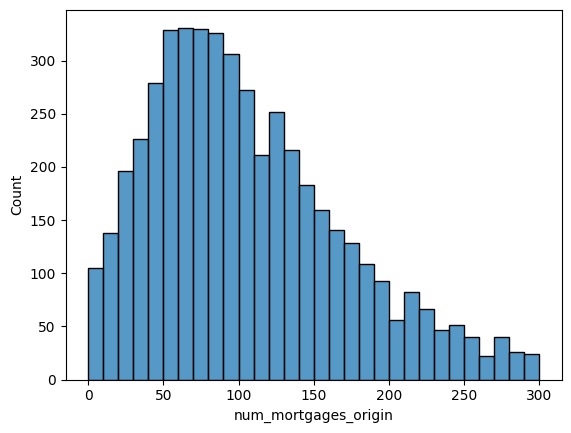

In [ ]:
sns.histplot(data=dff.num_mortgages_origin,binrange=(0,300),stat="count")

<Axes: >

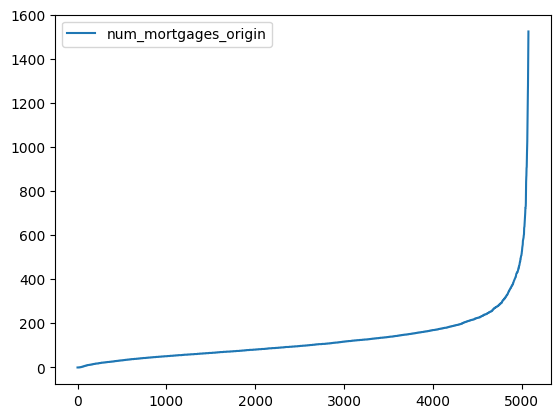

In [ ]:
dff.num_mortgages_origin.sort_values(ascending=True).reset_index().plot(y="num_mortgages_origin")

<Axes: xlabel='num_mortgages_origin', ylabel='total_cdfi_lending'>

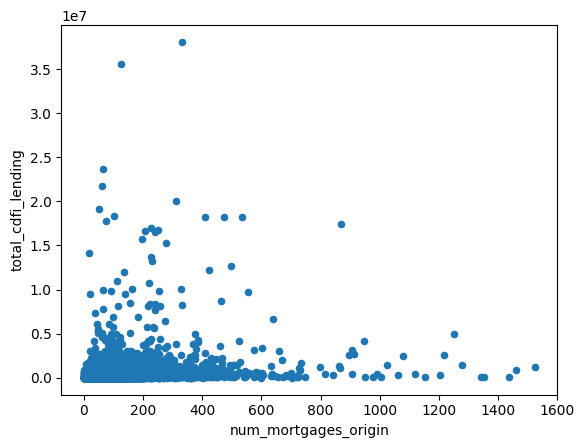

In [ ]:
dff.plot(kind="scatter",x="num_mortgages_origin",y="total_cdfi_lending")

interesting..  I thought there would be more lending to the places with more mortgages.  Instead it looks like the places with lots of CDFI lending are pretty disjoint from those with lots of mortgages.
That said, what is this mortgages field exactly?  Maybe that is all in census tract and not necessarily those that are a result of CDFI lending?
https://ffiec.cfpb.gov/documentation/publications/loan-level-datasets/lar-data-fields

Let's see how it number of mortgages tracks with census tract total population


<Axes: xlabel='total_pop', ylabel='num_mortgages_origin'>

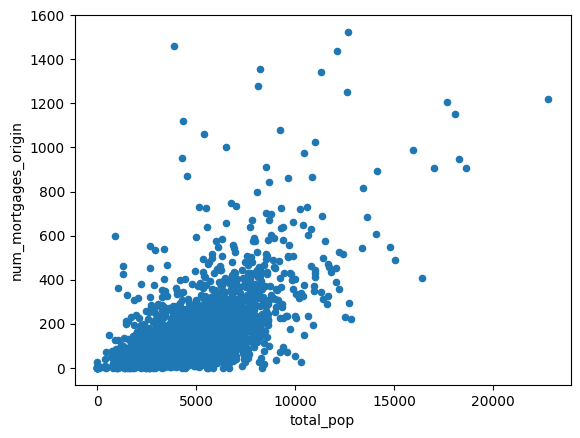

In [ ]:
dff.plot(kind="scatter",x="total_pop",y="num_mortgages_origin")

Let's look at these when limited to CDFI investment areas

<Axes: xlabel='num_mortgages_origin', ylabel='total_cdfi_lending'>

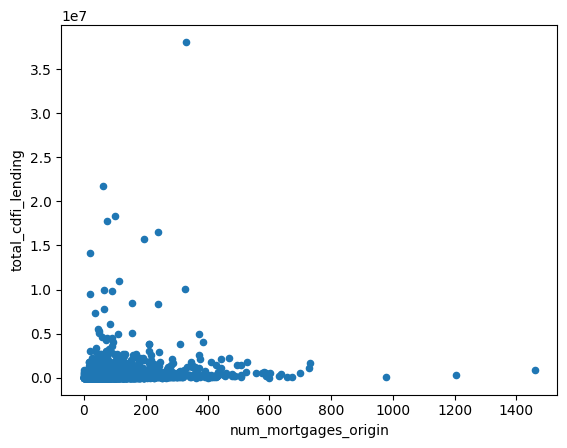

In [ ]:
dff[dff.investment_areas==1].plot(kind="scatter",x="num_mortgages_origin",y="total_cdfi_lending")

### CDFI lending

Let's focus on CDFI lending instead

<Axes: >

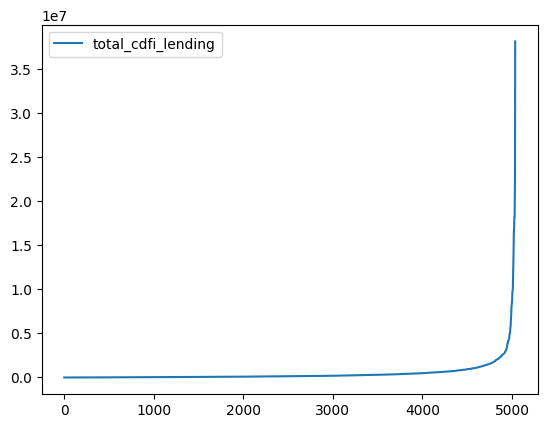

In [ ]:
dff.total_cdfi_lending.sort_values(ascending=True).reset_index().plot(y="total_cdfi_lending")

This also has a crazy tail. Let's see how much of the funding went to it

In [ ]:
dff.total_cdfi_lending.sum()

2449032893.0

In [ ]:
# what percent of total mortages and lending went to the 5% of census tracts with > 300 mortgages each
val=6000000
display(f"percent of total lending to census tracts with more than ${val} funding",
    100*dff.loc[dff.total_cdfi_lending>=val,["total_cdfi_lending"]].sum()/dff.total_cdfi_lending.sum(),
        f"percent of census tracts with more than ${val} funding",
    100*dff.loc[dff.total_cdfi_lending>=val,["total_cdfi_lending"]].count()/dff.total_cdfi_lending.count()
)

'percent of total lending to census tracts with more than $6000000 funding'

,0
total_cdfi_lending,27.371389


'percent of census tracts with more than $6000000 funding'

,0
total_cdfi_lending,1.012708


Hmm.. let's see how CDFI lending compares vs census tract population

<Axes: xlabel='total_pop', ylabel='total_cdfi_lending'>

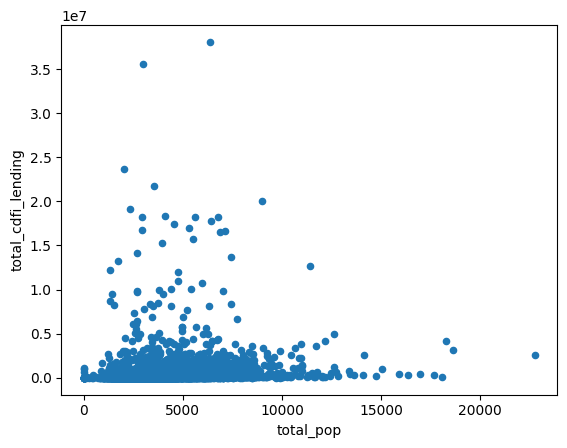

In [ ]:
#dff.plot(kind="scatter",x="num_mortgages_origin",y="total_cdfi_lending")
dff.plot(kind="scatter",x="total_pop",y="total_cdfi_lending")

How I'm totally puzzled.  Total_cdfi_lending seems to have nothing to do with investment_areas.  I thought that investment_areas were the places where CDFI does its lending???!  What am I missing?

<Axes: xlabel='investment_areas'>

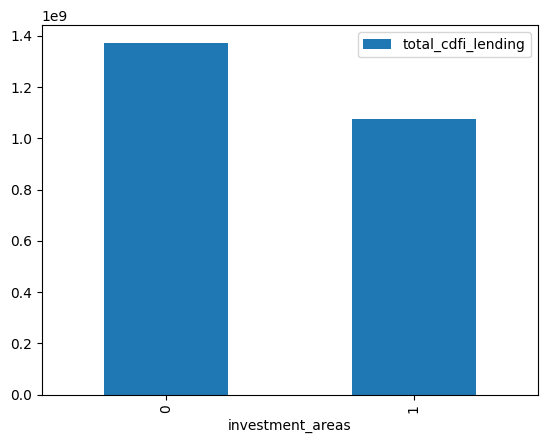

In [ ]:
dff.groupby("investment_areas").sum().plot(kind="bar",y="total_cdfi_lending")

<Axes: xlabel='num_mortgages_origin'>

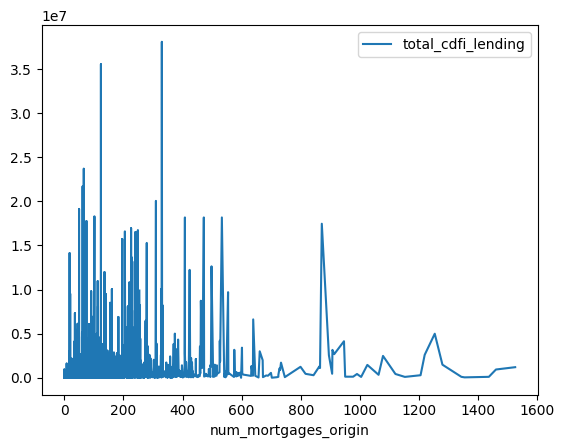

In [ ]:
dff.sort_values(by="num_mortgages_origin").plot(x="num_mortgages_origin",y="total_cdfi_lending")

<Axes: ylabel='num_mortgages_origin'>

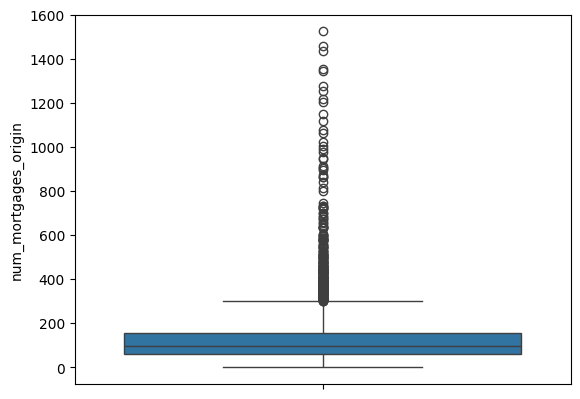

In [ ]:
sns.boxplot(data=dff.num_mortgages_origin)

Wow, it looks like a lot of mortages come from a few census tracts. Maybe these tracts have very high populations?  Would be useful to get population data and compare (by scatterplot or heatmap or something).

Also, how does num_mortgages compare to total CDFI lending?  Presumably should..

### A detour into the CDFI LAR dataset again

Let's look at the CDFI dataset data a bit more

In [ ]:
#dff.total_cdfi_lending.sort_values(ascending=True).reset_index().plot(y="total_cdfi_lending")
df_cdfi.sort_values(by="originalamount",ascending=False).head(10)

,org_id,trans_id,fiscalyear,originalamount,projectfipscode_2010,investeetype,dateclosed,purpose,transactiontype,originalinterestrate,...,affordablehouserent,loanclosedstatus,bankedattimeofintake,annualgrossrevenue,totalprojectcost,projectedftetenants,projectedjobsbusiness,projectedjobsconstruction,housingunitsrent,housingunitssale
10889,15510,159202,2021,37800000,12033003400,BUS,24-May-21,RECOCOM,LOC,4.250,...,NaN,ACTIVE,NaN,NaN,37800000.0,0.0,NaN,1745.0,NaN,NaN
10769,4465,141897,2021,26976390,12033000800,BUS,4-Mar-21,RECOCOM,TERM,4.500,...,NaN,ACTIVE,NaN,NaN,26976390.0,0.0,NaN,0.0,NaN,NaN
10772,4465,142100,2021,26852350,12033000800,BUS,8-Dec-21,RECOCOM,TERM,3.000,...,NaN,CLOSED,NaN,NaN,26852350.0,0.0,NaN,0.0,NaN,NaN
11173,15510,160217,2021,14989017,12131950601,BUS,14-Jan-21,RECOCOM,LOC,3.750,...,NaN,ACTIVE,NaN,NaN,14989017.0,0.0,NaN,692.0,NaN,NaN
11064,15510,160097,2021,14000000,12005001600,BUS,21-Jun-21,RECOCOM,LOC,3.220,...,NaN,ACTIVE,NaN,NaN,14000000.0,0.0,NaN,646.0,NaN,NaN
10653,4465,131992,2020,13115458,12113010809,BUS,26-Oct-20,RECOCOM,TERM,4.000,...,NaN,ACTIVE,NaN,NaN,13115458.0,0.0,NaN,0.0,NaN,NaN
11172,15510,160216,2021,11539521,12131950601,BUS,14-Jan-21,RECOCOM,LOC,3.750,...,NaN,ACTIVE,NaN,NaN,11539521.0,0.0,NaN,533.0,NaN,NaN
11033,15510,160060,2021,10500000,12033002500,BUS,20-May-21,RECOCOM,TERM,2.920,...,NaN,ACTIVE,NaN,NaN,10500000.0,0.0,NaN,485.0,NaN,NaN
19367,5050,244257,2021,10000000,12001001202,BUS,23-Dec-20,RECOMULTI,LOC,2.247,...,62.0,ACTIVE,NaN,1496583.0,15562153.0,0.0,NaN,46.0,62.0,0.0
10646,4465,131547,2020,8000000,12033000100,BUS,26-Jun-20,RECOCOM,LOC,2.950,...,NaN,ACTIVE,NaN,NaN,8000000.0,0.0,NaN,0.0,NaN,NaN


In [ ]:
df_cdfi.loc[:,["originalamount","projectfipscode_2010"]].groupby("projectfipscode_2010").sum().sort_values(by="originalamount",ascending=False).head(10)

,originalamount
projectfipscode_2010,
12033000800,59173771
12131950601,53640438
12033003400,37921846
12131950602,21173366
12033000100,18876468
12033003507,17708363
12131950603,17377982
12033002500,16738183
12113010809,16660302


In [ ]:
df.loc[:,["geoid","total_cdfi_lending"]].sort_values(by="total_cdfi_lending",ascending=False).head(10)

,geoid,total_cdfi_lending
1586,12033003400,3.807847e+07
1577,12033000802,3.553209e+07
2881,12033000801,2.368806e+07
5158,12133970103,2.167922e+07
3923,12009063105,2.004414e+07
1575,12033000100,1.912955e+07
3902,12005001100,1.829863e+07
3877,12131950604,1.817132e+07
1259,12131950605,1.817132e+07
2544,12131950606,1.817132e+07


hmm.. below shows the spending in the top geoid for lending in the df dataset.  By far the biggest transaction was for the one with purpose "RECOCOM". It looks like that means commercial real estate construction (rather than residential).  Can find a descripton of purpose fields on page 24 of this:
https://www.cdfifund.gov/sites/cdfi/files/2021-08/NMTCAllocateeTLRGuidance_Final_Sept2021.pdf

Am interested to see how funding breaks down by purpose. Also curious about org_ids

In [ ]:
df_cdfi[df_cdfi.projectfipscode_2010==12033003400].head().T

,9814,10507,10889,11437,15467
org_id,4350,17024,15510,15510,4925
trans_id,113559,120662,159202,160564,217908
fiscalyear,2021,2021,2021,2021,2021
originalamount,16847,73084,37800000,15985,7965
projectfipscode_2010,12033003400,12033003400,12033003400,12033003400,12033003400
investeetype,BUS,BUS,BUS,BUS,BUS
dateclosed,3-Mar-21,8-Dec-21,24-May-21,2-Mar-21,6-Apr-21
purpose,BUSINESS,BUSINESS,RECOCOM,MICRO,MICRO
transactiontype,TERM,TERM,LOC,TERM,TERM
originalinterestrate,1.0,4.0,4.25,1.0,1.0


In [ ]:
for col in ["purpose","entitystructure","investeetype","org_id"]:
  display(df_cdfi.loc[:,["originalamount",col]].groupby(col).sum().sort_values(by="originalamount",ascending=False))

,originalamount
purpose,
HOMEPURCH,354053007
HOMEIMP,306278652
RECOCOM,303188617
BUSINESS,255611999
RECOSINGLE,94538848
MICRO,79917324
RERHSINGLE,25874029
RECOMULTI,25184614
RERHCOM,12705057


,originalamount
entitystructure,
FORPROFIT,776849201
NONPROFIT,34111959
OTHER,361689


,originalamount
investeetype,
BUS,811322849
IND,670610229
CDFI,4000000


,originalamount
org_id,
6690,386994958
15510,328718965
21977,145563776
4465,132784265
17024,89663767
...,...
3944,8400
3558,7500
11602,4540


In [ ]:
df_cdfi[df_cdfi.investeetype=="IND"].loc[:,["purpose","originalamount"]].groupby("purpose").sum().sort_values(by="originalamount",ascending=False)

,originalamount
purpose,
HOMEPURCH,354053007
HOMEIMP,306278652
CONSUMER,8527083
OTHER,1681077
MICRO,70410


In [ ]:
pd.crosstab(df_cdfi.entitystructure,df_cdfi.investeetype)
#df_cdfi.loc[:,["originalamount","entitystructure","investeetype"]].groupby(["entitystructure","investeetype"]).sum().sort_values(by="originalamount",ascending=False)

investeetype,BUS
entitystructure,
FORPROFIT,11067
NONPROFIT,67
OTHER,3


<Axes: >

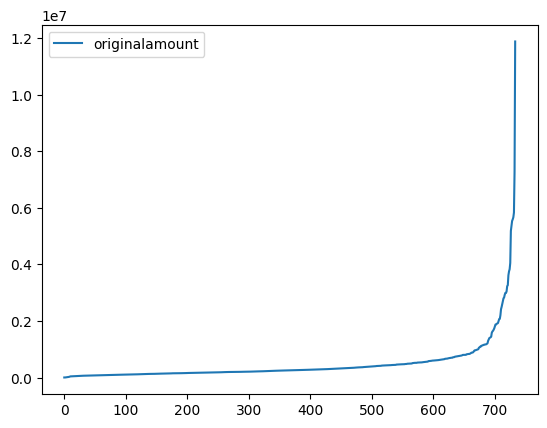

In [ ]:
df_home_purchase_lending=df_cdfi[df_cdfi.purpose=="HOMEPURCH"].loc[:,["originalamount","projectfipscode_2010"]].groupby("projectfipscode_2010").sum()
df_home_purchase_lending.sort_values(by="originalamount",ascending=True).reset_index().plot(y="originalamount")

In [ ]:
df_home_purchase_lending.sort_values(by="originalamount",ascending=False).head()

,originalamount
projectfipscode_2010,
12131950602,11876550
12009063105,7275076
12005002704,5830561
12009061001,5661168
12009064128,5589753


look like lots of expensive home purchases, and they are mostly by org_id 15510!

In [ ]:
df_cdfi[df_cdfi.projectfipscode_2010==12131950602].sort_values(by="originalamount",ascending=False).head(10)

,org_id,trans_id,fiscalyear,originalamount,projectfipscode_2010,investeetype,dateclosed,purpose,transactiontype,originalinterestrate,...,affordablehouserent,loanclosedstatus,bankedattimeofintake,annualgrossrevenue,totalprojectcost,projectedftetenants,projectedjobsbusiness,projectedjobsconstruction,housingunitsrent,housingunitssale
11620,15510,162007,2021,2500000,12131950602,IND,21-Jan-21,HOMEPURCH,TERM,3.75,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11619,15510,161991,2021,2018750,12131950602,IND,21-May-21,HOMEPURCH,TERM,3.20,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11222,15510,160267,2021,2000000,12131950602,IND,9-Jul-21,HOMEIMP,LOC,4.00,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11630,15510,162048,2021,1280800,12131950602,BUS,12-Oct-21,RERHSINGLE,TERM,3.20,...,0.0,ACTIVE,NaN,NaN,1280800.0,0.0,NaN,59.0,0.0,1.0
10827,19864,157577,2021,1047500,12131950602,IND,24-Jun-21,HOMEPURCH,TERM,0.00,...,NaN,SOLD,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10825,19864,156521,2021,1047500,12131950602,IND,18-Jun-21,HOMEPURCH,TERM,3.00,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11626,15510,162037,2021,1000000,12131950602,IND,9-Nov-21,HOMEPURCH,TERM,3.45,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11322,15510,160370,2021,944000,12131950602,IND,23-Dec-21,HOMEPURCH,TERM,4.25,...,NaN,ACTIVE,Do Not Know,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11598,15510,161953,2021,900000,12131950602,BUS,20-Jul-21,RECOCOM,TERM,3.50,...,NaN,ACTIVE,NaN,NaN,900000.0,0.0,NaN,42.0,NaN,NaN
11324,15510,160372,2021,704000,12131950602,BUS,27-Dec-21,RECOSINGLE,LOC,4.00,...,0.0,ACTIVE,NaN,NaN,704000.0,0.0,NaN,32.0,0.0,1.0


In [ ]:
df[df.geoid==12131950602]

,geoid,geoid_year,state,county_name,state_fips_code,county,gini_index_est,gini_index_moe,emp_status_16plus_est,emp_status_16plus_moe,...,fire_risk_30yr_pctile,flood_risk_30yr_share,flood_risk_30yr_pctile,underground_tanks,cdfi_fund_invest_areas,has_cdfi_lending,full_geoid,full_name,total_pop,total_households


<Axes: xlabel='total_pop', ylabel='originalamount'>

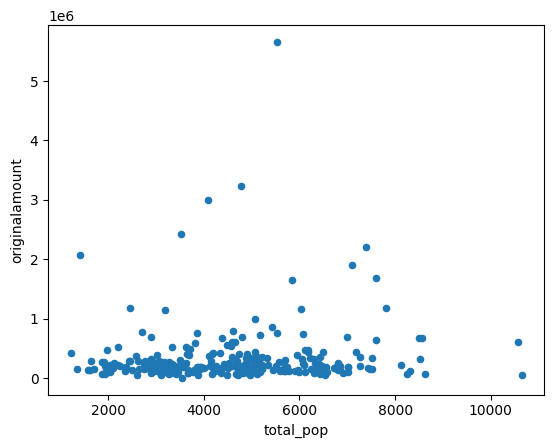

In [ ]:
dd=df_home_purchase_lending.merge(df.loc[:,["geoid","investment_areas","total_pop"]],left_on="projectfipscode_2010",right_on="geoid")
dd[dd.investment_areas==1].plot(kind="scatter",x="total_pop",y="originalamount")
#dff.groupby("investment_areas").sum().plot(kind="bar",y="total_cdfi_lending")

<Axes: xlabel='investment_areas'>

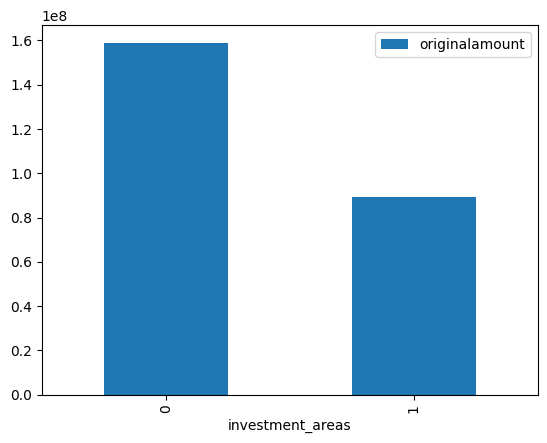

In [ ]:
dd.groupby("investment_areas").sum().plot(kind="bar",y="originalamount")

Let's look at where the org_ids spending the most money are putting it

In [ ]:
pd.crosstab(df_cdfi.query("org_id==15510 or org_id==6690").org_id,[df_cdfi.investeetype, df_cdfi.purpose])

investeetype      BUS                                                     \
purpose      BUSINESS MICRO OTHER RECOCOM RECOMULTI RECOSINGLE RERHMULTI   
org_id                                                                     
6690              118   327     0       5         1          0         4   
15510             144   251     1     179         0        113         0   

investeetype                IND            
purpose      RERHSINGLE HOMEIMP HOMEPURCH  
org_id                                     
6690                 14    4258       660  
15510                32      64        88

In [ ]:
dft=df_cdfi.query("org_id==15510 or org_id==6690")
display(pd.crosstab(dft.org_id,dft.investeetype,values=dft.originalamount,aggfunc="sum",normalize="index"))
display(pd.crosstab(dft.org_id,[dft.investeetype, dft.purpose],values=dft.originalamount,aggfunc="sum",normalize="index"))

investeetype,BUS,IND
org_id,,
6690,0.176575,0.823425
15510,0.837748,0.162252


investeetype       BUS                                                     \
purpose       BUSINESS     MICRO     OTHER   RECOCOM RECOMULTI RECOSINGLE   
org_id                                                                      
6690          0.125875  0.016730  0.000000  0.006798  0.011886   0.000000   
15510         0.081871  0.016254  0.000573  0.534949  0.000000   0.166311   

investeetype                            IND            
purpose      RERHMULTI RERHSINGLE   HOMEIMP HOMEPURCH  
org_id                                                 
6690          0.008895   0.006391  0.489361  0.334064  
15510         0.000000   0.037790  0.031627  0.130624

array([<Axes: title={'center': '6690'}>,
       <Axes: title={'center': '15510'}>], dtype=object)

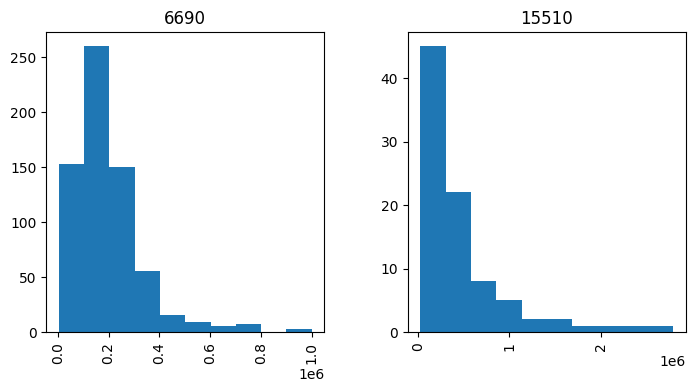

In [ ]:
dft.query("purpose=='HOMEPURCH'").hist(column="originalamount",by="org_id",figsize=(8,4))

In [ ]:
dfth=dft.query("purpose=='HOMEPURCH'")
dfth["quantized_loan"]=dfth.originalamount//1000000*1000000
dfth["1m_loan"]=dfth.originalamount.apply(lambda x: x>=1000000)

<ipython-input-45-2bd9977f6920>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfth["quantized_loan"]=dfth.originalamount//1000000*1000000
<ipython-input-45-2bd9977f6920>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfth["1m_loan"]=dfth.originalamount.apply(lambda x: x>=1000000)


<Axes: xlabel='quantized_loan'>

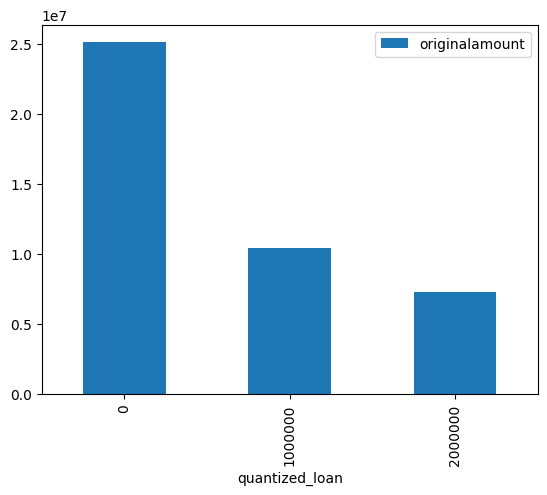

In [ ]:
dfth.query("org_id==15510").loc[:,["quantized_loan","originalamount"]].groupby("quantized_loan").sum().plot(kind="bar",stacked=True)

<Axes: title={'center': 'dollars spent on home purchase loans >= $1 million in org_id 15510'}, xlabel='1m_loan'>

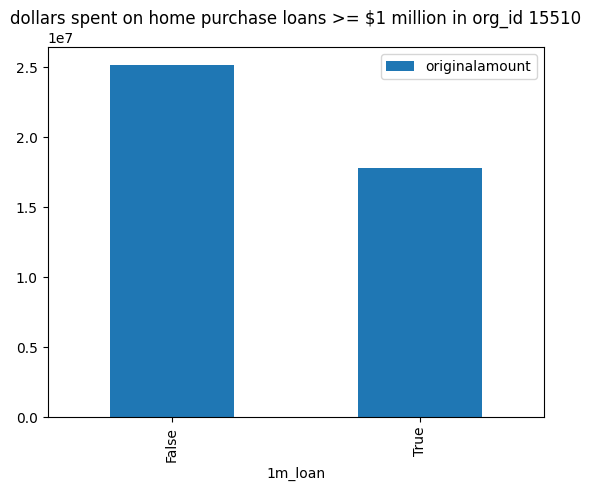

In [ ]:
dfth.query("org_id==15510").loc[:,["1m_loan","originalamount"]].groupby("1m_loan").sum().plot(kind="bar",stacked=True,title="dollars spent on home purchase loans >= $1 million in org_id 15510")

<Axes: title={'center': 'dollars spent on home purchase loans >= $1 million in org_id 6690'}, xlabel='1m_loan'>

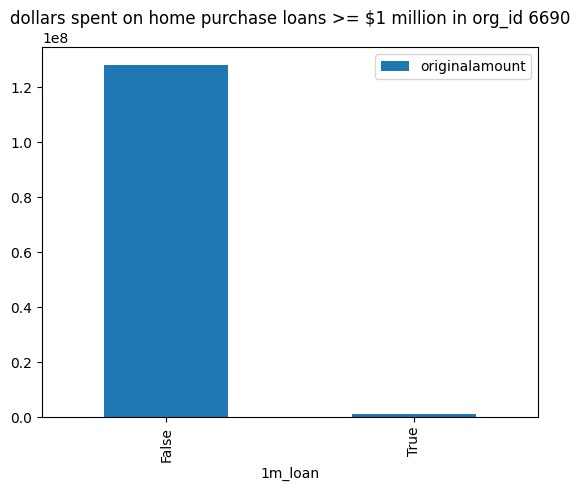

In [ ]:
dfth.query("org_id==6690").loc[:,["1m_loan","originalamount"]].groupby("1m_loan").sum().plot(kind="bar",stacked=True,title="dollars spent on home purchase loans >= $1 million in org_id 6690")

In [ ]:
col="purpose"
org=15510
qstr=f"org_id=={org}"
dfth.head().T

,2050,2109,2112,2114,2115
org_id,6690,6690,6690,6690,6690
trans_id,104796,105006,105013,105015,105016
fiscalyear,2021,2021,2021,2021,2021
originalamount,111500,124000,101271,206400,147283
projectfipscode_2010,12105011501,12101032010,12057006200,12083002401,12057013804
...,...,...,...,...,...
projectedjobsconstruction,NaN,NaN,NaN,NaN,NaN
housingunitsrent,NaN,NaN,NaN,NaN,NaN
housingunitssale,NaN,NaN,NaN,NaN,NaN
quantized_loan,0,0,0,0,0


<Axes: xlabel='lowincomestatus'>

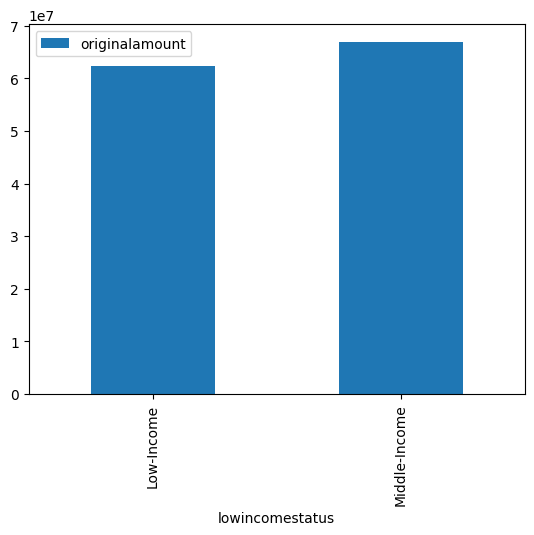

In [ ]:
dfth.query("org_id==6690").loc[:,["lowincomestatus","originalamount"]].groupby("lowincomestatus").sum().plot(kind="bar")

<Axes: xlabel='lowincomestatus'>

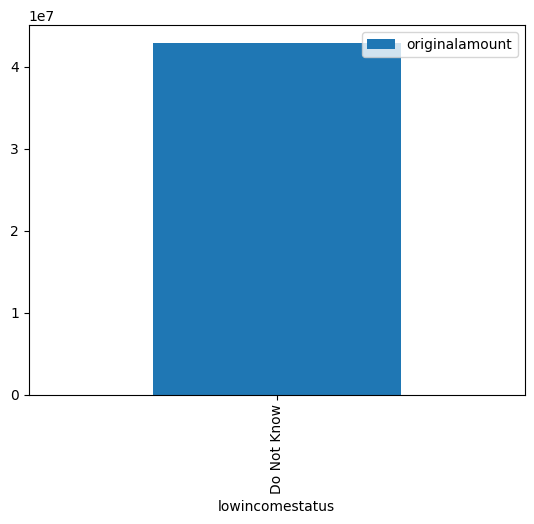

In [ ]:
dfth.query("org_id==15510").loc[:,["lowincomestatus","originalamount"]].groupby("lowincomestatus").sum().plot(kind="bar")

Am left wondering, how does investee_type compare in investment_areas vs outside:  i.e. how much individual vs business. (sadly, can't compare because of different geoid years)

And why tail still so big?  Where are the individual investments happening? (which census tracts) and why?  (I looked at one. looks like lots of expensive individual home purchase loans - presumably somewhere with expensive houses). -- I dug into this a bit. It looks like orgid 15510 is making big investments mostly in business, and its home purchase funding is over 1/3 spend on $1 million dollar loans. Do these actually help with affordable housing for people living in investment_areas?

so sad below...  I think can't do them because of mismatch because CDFI data is using 2010 geoids rather than 2020.................  That said, how did DataKind get loan_amount then? Is there some remapping table somewhere for converting 2010 geoids to 2020 ones?  Could that explain why the totals are different - maybe if remapping is one to many they end up overcounting?

Also, how many mortgages in investment_areas are from CDFI?  (compare df_cdfi to df mortgages field in investment_areas.

Should probably add a couple of columns to df, for num cdfi home purchase loans, and one for total cdfi invidual investment, and one for total cdfi business investment.

Still a mystery about geoids and why not aligned between datasets, and why the sum is so different for total cdfi lending, so.. yeah..

Things I'm still curious about, which can do even with mismatched geoids..

- how was loan_amount determined in EODataScape? How was census ID remapping handled?
- who is org_id 15510?
  -- Haven't been able to figure that out
- can we break down mortgage funding by whether recipient was low income?
-- Yes, there is a field lowincomestatus. However, is set to "Do Not Know" for loans from org_id 15510 (unlike 6690, which is pretty even between low and middle income)
- is there some site where we can see if the $2 home loan was in an investment area according to 2010 census tract ids?
-- Yes, https://www.cdfifund.gov/cims
-- I looked there and the 2010 census id tract with massive home loans is not investment area.  But the one with the 37 million dollar business investment is. That tract is not poverty qualified, but is qualified due to median income and unemployment rate.
-- I took screen shots of the census tool, saved to my Desktop


## Do the geographies for these three programs overlap?

### Cross-tabulations

In [ ]:
# do a crosstabulation of number of census tracts in each combination of
pd.crosstab(df2.economic_distress_pop_agg,[df2.opzone,df2.qct,df2.investment_areas])

opzone                        0                  1             
qct                           0         1        0       1     
investment_areas              0     1   0    1   0    1  0    1
economic_distress_pop_agg                                      
0                          2174  1211  10  118  38  101  1   15
1                           113   514   7  503   3   89  0  263

In [ ]:
pd.crosstab(df2.economic_distress_pop_agg,df2.investment_areas)

investment_areas,0,1
economic_distress_pop_agg,,
0,2223,1445
1,123,1369


In [ ]:
pd.crosstab(df2.economic_distress_pop_agg,df2.opzone)

opzone,0,1
economic_distress_pop_agg,,
0,3513,155
1,1137,355


In [ ]:
pd.crosstab(df2.economic_distress_pop_agg,[df2.qct])

qct,0,1
economic_distress_pop_agg,,
0,3524,144
1,719,773


In [ ]:
pd.crosstab(df2.economic_distress_pop_agg,[df2.opzone,df2.qct])

opzone                        0         1     
qct                           0    1    0    1
economic_distress_pop_agg                     
0                          3385  128  139   16
1                           627  510   92  263

In [ ]:
pd.crosstab(df2.economic_distress_pop_agg,[df2.opzone,df2.qct]).T.sum()


,0
economic_distress_pop_agg,
0,3668
1,1492


### Venn Diagrams

In [ ]:
df2.dtypes

,0
geoid,int64
county,int64
opzone,int64
investment_areas,int64
qct,int64
economic_distress_pop_agg,int64
total_cdfi_lending,float64
total_pop,int64
total_households,int64


In [ ]:
# add column like "101", "010" etc indicating membership in investment_areas, opzone, and qct by digit
df2["venn_key"]=df2.apply(lambda x: str(x.investment_areas)[0]+str(x.opzone)[0]+str(x.qct)[0],axis=1)

In [ ]:
a=df2.groupby("venn_key").sum() #.to_dict()
a.total_pop/a.total_pop.sum()
"""
a["total_pop"].normalised=a.total_pop/a.total_pop.sum()
a["total_households"].normalised=a.total_households/a.total_households.sum()
a
"""
#a["total_cdfi_lending"].to_dict()

'\na["total_pop"].normalised=a.total_pop/a.total_pop.sum()\na["total_households"].normalised=a.total_households/a.total_households.sum()\na\n'

In [ ]:
a.index.dtype

dtype('O')

In [ ]:
plt.pie

<function matplotlib.pyplot.pie(x: 'ArrayLike', explode: 'ArrayLike | None' = None, labels: 'Sequence[str] | None' = None, colors: 'ColorType | Sequence[ColorType] | None' = None, autopct: 'str | Callable[[float], str] | None' = None, pctdistance: 'float' = 0.6, shadow: 'bool' = False, labeldistance: 'float | None' = 1.1, startangle: 'float' = 0, radius: 'float' = 1, counterclock: 'bool' = True, wedgeprops: 'dict[str, Any] | None' = None, textprops: 'dict[str, Any] | None' = None, center: 'tuple[float, float]' = (0, 0), frame: 'bool' = False, rotatelabels: 'bool' = False, *, normalize: 'bool' = True, hatch: 'str | Sequence[str] | None' = None, data=None) -> 'tuple[list[Wedge], list[Text]] | tuple[list[Wedge], list[Text], list[Text]]'>

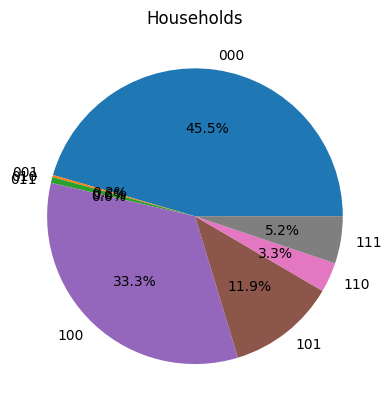

In [ ]:


fig, ax = plt.subplots()

plt.pie(a.total_pop,autopct='%1.1f%%',labels=a.index.astype(str))
#venn3(a["total_households"].apply(lambda x: x/1000).to_dict(),set_labels=labels,ax=ax)
plt.title("Households")
plt.show()

In [ ]:
plt

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

In [ ]:
venn3

<function matplotlib_venn._venn3.venn3(subsets: Union[Tuple[set, set, set], Dict[str, float], Tuple[float, float, float, float, float, float, float]], set_labels: Optional[Tuple[str, str, str]] = ('A', 'B', 'C'), set_colors: Tuple[Any, Any, Any] = ('r', 'g', 'b'), alpha: float = 0.4, normalize_to: Optional[float] = None, ax: Optional[matplotlib.axes._axes.Axes] = None, subset_label_formatter: Optional[Callable[[float], str]] = None, layout_algorithm: Optional[matplotlib_venn.layout.api.VennLayoutAlgorithm] = None) -> matplotlib_venn._common.VennDiagram>

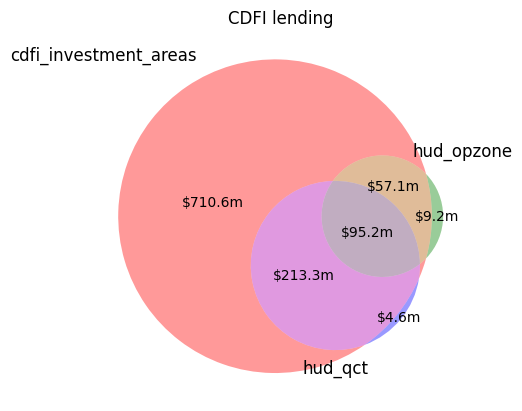

In [ ]:
labels=["cdfi_investment_areas","hud_opzone","hud_qct"]
v=venn3(a["total_cdfi_lending"].to_dict(),subset_label_formatter=lambda x: f"${x/1000000:,.1f}m",set_labels=labels)

plt.title("CDFI lending")
plt.show()


In [ ]:
100*a.total_pop/a.total_pop.sum()

,total_pop
venn_key,
000,45.505673
001,0.231027
010,0.639153
011,0.005669
100,33.314731
101,11.872174
110,3.266213
111,5.165360


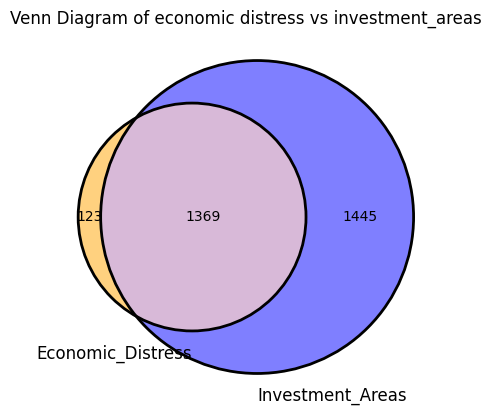

In [ ]:
ctf=pd.crosstab(df2.economic_distress_pop_agg,df2.investment_areas)
# depict venn diagram
subsets = (ctf[0][1], ctf[1][0], ctf[1][1])
venn2(subsets,
      set_labels = ('Economic_Distress',
                    'Investment_Areas'),
      set_colors=("orange",
                  "blue"),alpha=0.5)

# add outline
venn2_circles(subsets)
# assign title of the venn diagram
plt.title("Venn Diagram of economic distress vs investment_areas")
plt.show()


Useful resource for plotting Venn diagrams:
https://www.geeksforgeeks.org/how-to-create-and-customize-venn-diagrams-in-python/#

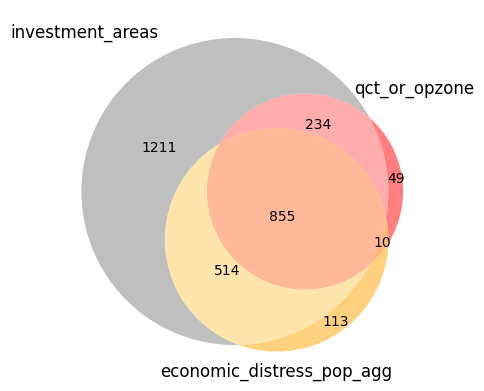

In [ ]:
# create venn diagram without crosstab

setI=set(df2[df2.investment_areas==1].geoid.values)
setEP=set(df2[df2.economic_distress_pop_agg==1].geoid.values)
#setES=set(df2[df2.economic_distress_simple_agg==1].geoid.values)

setQ=set(df2[df2.qct==1].geoid.values)
setOP=set(df2[df2.opzone==1].geoid.values)
#venn2((set1, set2), ('investment_areas', 'economic_distress_pop_agg'),set_colors=("blue",
#                  "orange"),alpha=0.5)
#venn3((setI, setEP, setES), ('investment_areas', 'economic_distress_pop_agg','economic_distress_simple_agg'),set_colors=("blue",
#                  "orange","red"),alpha=0.5)
#venn3((setI,setQ,setOP),('investment_areas','qct','opzone'),set_colors=("blue","green","red"),alpha=0.5)
setM=set(df2.query("qct==1 or opzone==1").geoid.values)
venn3((setI,setM,setEP),('investment_areas', 'qct_or_opzone','economic_distress_pop_agg'),set_colors=("grey","red","orange"),alpha=0.5)
plt.show()
#set2

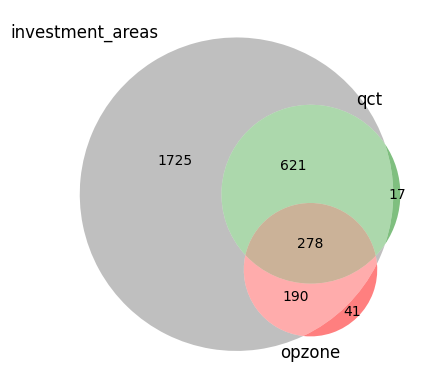

In [ ]:
venn3((setI,setQ,setOP),('investment_areas','qct','opzone'),set_colors=("grey","green","red"),alpha=0.5)
#venn3_circles(subsets=(setI,setQ,setOP),
#              linestyle="dashed", linewidth=2)
plt.show()

## How do populations vary by program?
https://docs.kanaries.net/topics/Pandas/pandas-plot-histogram

https://eodatascape.datakind.org/data-dictionary

TODO:
* add titles to plotly radial graphs:
fig.update_layout(title="My Plot Title")
* figure out how to plot multiple figures as subplots
* include the graphs that are unfiltered, and include commentary about why filtering as we are
* how to get population/population density?  
* would be interesting to know what proportion of needy people live in HUD areas overall and by demographics (age, race etc)


### Distribution Comparisons via Plotly Scatterpolar

#### define helper functions for computing and plotting quantiles
*Must run this cell to be able to generate plots in this section*

In [ ]:
#!pip install kaleido # attempting to get plotly to show up as static images for Git and nbviewer

#define helper functions to generate and plot quantilies
import plotly.graph_objects as go

"""
# uncomment this to make things viewable in Jupityner nbviewer. Alas, that breaks making things visible in Colab
import plotly.offline as pyo # trying to get plotly to work in Jupyter nbviewer
# Set notebook mode to work in offline
pyo.init_notebook_mode()
"""

# try this to see if will work to make plotly visible in Git
#import plotly.io as pio
#pio.renderers.default = 'notebook_connected+colab'


# fillOptions are: "none", "toself", and "tonext", for plotly scatterpolar
# line options are: 'solid' : Solid line, 'dash': Dashed line, 'dashdot': Dash-dot line, 'longdash': Long dashed line, and 'longdashdot': Long dash-dot line.
my_quantiles_styled={
    0.25: ["25th","dash","none"],
    0.75: ["75th","dash","tonext"],
    0.5: ["50th","solid","none"],
    0.9: ["90th","dash","none"],
    1.0: ["100th","dot","none"],
}

my_gov_programs_dict={
    "investment_areas" : {"filter" : "investment_areas=='YES'", "color":"red","legend_prefix":"ia:"},
    "opzone" : {"filter" : "opzone==1", "color":"green", "legend_prefix" : "opzone:"},
    "qct" : {"filter" : "qct==1", "color":"purple", "legend_prefix":"qct:"},
}


# returns a dataframe with quantiles, given:
#   an input dataframe,
#   a dictionary of columns to compute quantiles for,
#      with key=column name in dataframe, value=name to use in plots
#   an optional row filter string to apply before computing quantiles
def make_quantiles(ldf,desired_columns_dict,row_filter_str=None):
  f = [*desired_columns_dict][0]+">=0" # have this to remove rows with negative/error values, though this is dodgy for some columns..
#  print("excluding ", ldf.query(desired_columns[0]+"<0").iloc[:,0].count()," rows with negative values in first column")
  if (row_filter_str):
    f += " and ("+row_filter_str+")"
  q = ldf.query(f).loc[:,[*desired_columns_dict]].quantile([*my_quantiles_styled]) # fancy way of saying list(my_quantiles_styled.keys())
  return q.rename(columns=desired_columns_dict)

# returns a dict of quantile dataframes, on per government program type
def make_quantiles_by_gov_program(ldf,desired_columns_dict,row_filter_str=None):
  qdict={}
  for k,v in my_gov_programs_dict.items():
#    print("making quantiles for ",k)
    fstr=v["filter"]
    if (row_filter_str):
      fstr += " and ("+row_filter_str+")"
    qdict[k]=make_quantiles(ldf,desired_columns_dict,fstr)
  return qdict

# returns a figure with a trace added per quantile
def plot_quantiles(fig,quantiles,mycolor="blue",desired_range_max=100,name_prefix=""):
  for i in quantiles.index:
    fig.add_trace(go.Scatterpolar(
        r=quantiles.loc[i,:],
        theta=quantiles.columns,
        fill=my_quantiles_styled[i][2],
        name=name_prefix+my_quantiles_styled[i][0],
        mode='lines+markers',
        line=dict(color=mycolor, width=2, dash=my_quantiles_styled[i][1])
    ))
  fig.update_layout(
      polar=dict(
        radialaxis=dict(
          visible=True,
          range=[0, desired_range_max]
        )),
      showlegend=True
  )
  return fig

# returns a figure with a trace added per quantile
def plot_quantiles_by_gov_program(fig,gov_program_df_dict,desired_range_max=100,limit_rows=[],limit_cols=[]):
  for k,v in gov_program_df_dict.items():
    v2=v
    if (len(limit_rows)>0):
      v2=v2.loc[limit_rows,:]
    if (len(limit_cols)>0):
      v2=v2.loc[:,limit_cols]
    fig = plot_quantiles(fig,v2,my_gov_programs_dict[k]["color"],desired_range_max,my_gov_programs_dict[k]["legend_prefix"])
  return fig


#### Looking at racial demographics

In [ ]:

# keyed by column name, value is name to use when plotting
racial_diversity_columns_dict={
    "pop_pct_2plus_races" : "multi",
    "pop_pct_white" : "white",
    "pop_pct_black" : "black",
    "pop_pct_asian" : "asian",
    "pop_pct_native_hawaiian" : "hawaiian or pacific islander",
    "pop_pct_american_indian" : "native american",
    "pop_pct_other_race" : "other",
}


"""
# old version, for original dataset's column names
racial_diversity_columns_dict={
    "dp05_0035pe" : "multi",
    "dp05_0037pe" : "white",
    "dp05_0038pe" : "black",
    "dp05_0044pe" : "asian",
    "dp05_0052pe" : "hawaiian or pacific islander",
    "dp05_0039pe" : "native american",
    "dp05_0057pe" : "other",
}
"""

racial_quantiles=make_quantiles(df,racial_diversity_columns_dict)
gov_rqd=make_quantiles_by_gov_program(df,racial_diversity_columns_dict)


fig = go.Figure()

# limiting the set of quantiles and races for readability
fig = plot_quantiles(fig,racial_quantiles.loc[[0.5,0.9],["white","black","multi"]],"blue",100,"all:")
fig = plot_quantiles_by_gov_program(fig,gov_rqd,100,[0.5,0.9],["white","black","multi"])
fig.update_layout(
  title="Racial distribution in census tracts by government housing program. 50th and 90th percentile",
)


fig.show() #comment this out if trying to get to show up in Jupyter nbviewer

#pyo.iplot(fig) # uncomment this get to show up in Jupyter nbviewer


In [ ]:


poverty_race_columns_dict={
    "pov_2plus_races_pct_est" : "multi",
    "pov_white_pct_est" : "white",
    "pov_white_nh_pct_est" : "white non-hispanic",
    "pov_black_pct_est" : "black",
    "pov_hisp_lat_pct_est": "hispanic any race",
}

"""
# old version, for original dataset's column names
poverty_race_columns_dict={
    "s1701_c03_019e" : "multi",
    "s1701_c03_013e" : "white",
    "s1701_c03_021e" : "white non-hispanic",
    "s1701_c03_014e" : "black",
    "s1701_c03_020e": "hispanic any race",
}
"""

poverty_race_quantiles=make_quantiles(df,poverty_race_columns_dict)
gov_prqd=make_quantiles_by_gov_program(df,poverty_race_columns_dict)


fig = go.Figure()
# limiting set of races to show for readability, due to redundancy
cols=["white non-hispanic","black","multi"]

fig = plot_quantiles(fig,poverty_race_quantiles.loc[[0.5,0.9],cols],"blue",80,"all:")
fig = plot_quantiles_by_gov_program(fig,gov_prqd,80,[0.5,0.9],cols)

fig.show()
#pyo.iplot(fig) #trying to get to show up in Jupyter nbviewer

In [ ]:

fig = go.Figure()
fig = plot_quantiles(fig,racial_quantiles,"blue")
fig.show()

#### Look at environmental risk factors

https://screeningtool.geoplatform.gov/en/methodology#flood-risk


In [ ]:
df.head().T

,0,1,2,3,4
geoid,12001000600,12001000809,12001001100,12001001202,12001001519
geoid_year,2020,2020,2020,2020,2020
state,Florida,Florida,Florida,Florida,Florida
county_name,Alachua County,Alachua County,Alachua County,Alachua County,Alachua County
state_fips_code,12,12,12,12,12
...,...,...,...,...,...
has_cdfi_lending,True,False,True,True,True
full_geoid,1400000US12001000600,1400000US12001000809,1400000US12001001100,1400000US12001001202,1400000US12001001519
full_name,Census Tract 6; Alachua County; Florida,Census Tract 8.09; Alachua County; Florida,Census Tract 11; Alachua County; Florida,Census Tract 12.02; Alachua County; Florida,Census Tract 15.19; Alachua County; Florida
total_pop,4544,1163,6596,7443,2623


In [ ]:
df.query("not (fire_risk_30yr_share<=100 and flood_risk_30yr_share<=100)").loc[:,["investment_areas","qct","opzone"]].sum()
#.quantile([0.95,0.97.0.99.1.0])

,0
investment_areas,15
qct,4
opzone,4


In [ ]:
df.loc[:,["fire_risk_30yr_share","flood_risk_30yr_share"]].quantile([0.95,0.97,0.99,1.0])

,fire_risk_30yr_share,flood_risk_30yr_share
0.95,98.0,97.0
0.97,99.0,99.0
0.99,100.0,100.0
1.00,248.0,200.0


In [ ]:

environmental_risk_columns_dict={
    "fire_risk_30yr_share" : "fire",
    "flood_risk_30yr_share" : "flood",
    "exp_agri_loss_rate" : "ag_loss",
    "exp_build_loss_rate" : "bldg_loss",
    "exp_pop_loss_rate" : "pop_loss",
}

environmental_risk_perc_columns_dict={
    "fire_risk_30yr_pctile" : "fire",
    "flood_risk_30yr_pctile" : "flood",
    "exp_agri_loss_rate_pctile" : "ag_loss",
    "exp_build_loss_rate_pctile" : "bldg_loss",
    "exp_pop_loss_rate_pctile" : "pop_loss"
}

""" #these were the original column names from the original dataset
# keyed by column name, value is name to use when plotting
environmental_risk_columns_dict={
    "share_of_properties_at_risk_of_flood_in_30_years" : "flood",
    "share_of_properties_at_risk_of_fire_in_30_years" : "fire",
    "expected_agricultural_loss_rate_natural_hazards_risk_index" : "ag_loss",
    "expected_building_loss_rate_natural_hazards_risk_index" : "bldg_loss",
    "expected_population_loss_rate_natural_hazards_risk_index" : "pop_loss",
}

environmental_risk_perc_columns_dict={
    "share_of_properties_at_risk_of_flood_in_30_years_percentile" : "flood",
    "share_of_properties_at_risk_of_fire_in_30_years_percentile" : "fire",
    "expected_agricultural_loss_rate_natural_hazards_risk_index_percentile" : "ag_loss",
    "expected_building_loss_rate_natural_hazards_risk_index_percentile" : "bldg_loss",
    "expected_population_loss_rate_natural_hazards_risk_index_percentile" : "pop_loss",
}
"""

env_risk_quantiles=make_quantiles(df,environmental_risk_columns_dict)
env_risk_gqd=make_quantiles_by_gov_program(df,environmental_risk_columns_dict)


env_risk_perc_quantiles=make_quantiles(df,environmental_risk_perc_columns_dict)
env_risk_perc_gqd=make_quantiles_by_gov_program(df,environmental_risk_perc_columns_dict)

#fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'polar'}]*2]*2)
fig = go.Figure()

# limiting the set of quantiles and races for readability
#fig = plot_quantiles(fig,env_risk_perc_quantiles)
fig = plot_quantiles_by_gov_program(fig,env_risk_perc_gqd,100,[0.5,0.9])
#fig = plot_quantiles_by_gov_program(fig,gov_rqd,100,[0.5,0.9],["white","black","multi"])
fig.update_layout(
  title="Environmental risk in census tracts by government housing program. 50th and 90th percentile",
)


fig.show() #comment this out if trying to get to show up in Jupyter nbviewer

#pyo.iplot(fig) # uncomment this get to show up in Jupyter nbviewer

<ipython-input-79-64c254f08675>:19: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



Text(0.5, 1.0, 'after cleanup')

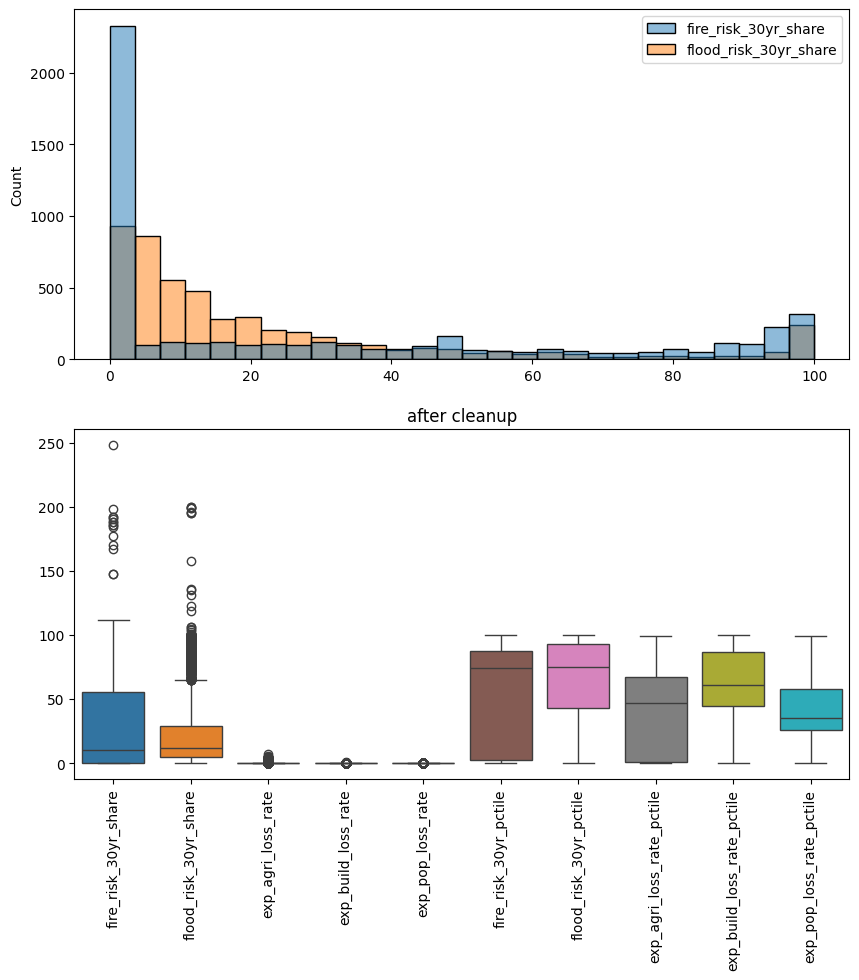

In [ ]:
import seaborn as sns


# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 10))


columns=[*environmental_risk_columns_dict]+[*environmental_risk_perc_columns_dict]
edf=df.loc[:,columns]

#edf=df.loc[:,["fire_risk_30yr_share","flood_risk_30yr_share","fire_risk_30yr_pctile","flood_risk_30yr_pctile"]]
# Plot on each subplot
sns.histplot(data=df.loc[:,["fire_risk_30yr_share","flood_risk_30yr_share"]].query("fire_risk_30yr_share<=100 and flood_risk_30yr_share<=100"), ax=axes[0])

sns.boxplot(data=edf, ax=axes[1])

# Rotate x-axis labels
ax=axes[1]
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("after cleanup")




<Axes: >

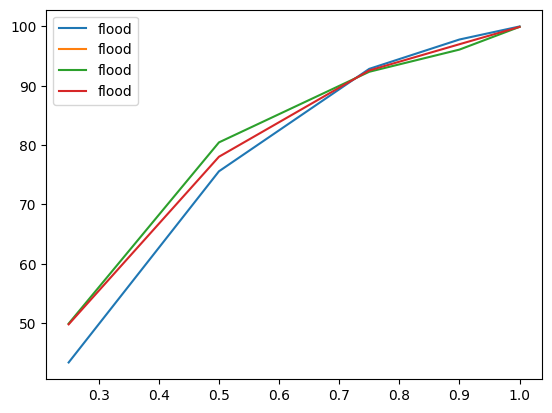

In [ ]:

pd.options.plotting.backend = "matplotlib"

hazard="flood"

"""
pd.concat([
    env_risk_quantiles[hazard],
    env_risk_gqd["investment_areas"][hazard],
    env_risk_gqd["opzone"][hazard],
    env_risk_gqd["qct"][hazard]
    ],
          axis=1).sort_index().plot()
"""
pd.concat([
    env_risk_perc_quantiles[hazard],
    env_risk_perc_gqd["investment_areas"][hazard],
    env_risk_perc_gqd["opzone"][hazard],
    env_risk_perc_gqd["qct"][hazard]
    ],
          axis=1).sort_index().plot()

<Axes: >

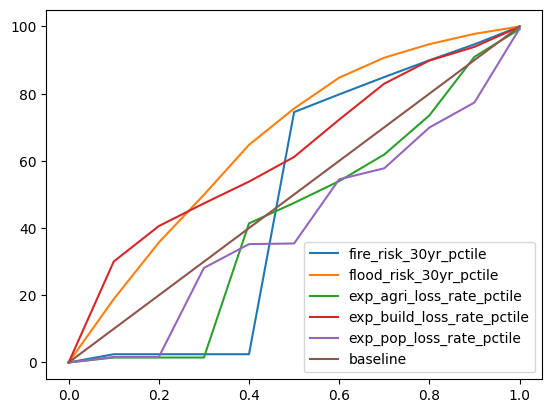

In [ ]:
#env_risk_perc_quantiles.sort_index().plot()
q=df.loc[:,[*environmental_risk_perc_columns_dict]].quantile([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
q["baseline"]=q.index*100
#fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'polar'}]*2]*2)
q.plot()



<Axes: >

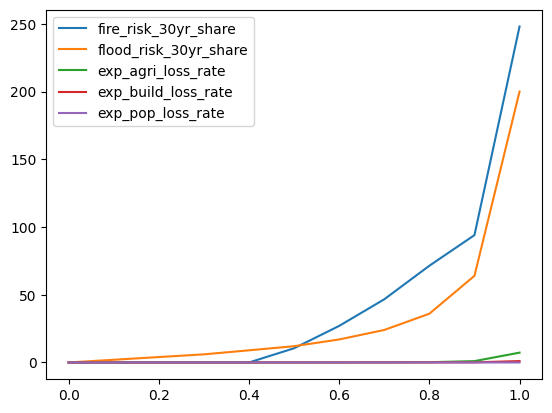

In [ ]:
q=df.loc[:,[*environmental_risk_columns_dict]].quantile([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
#q["baseline"]=q.index*100
#fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'polar'}]*2]*2)
q.plot()

#### EJScreen data

Let's look at the EPA's EJScreen (Environmental Justic Screen) data

https://www.epa.gov/ejscreen/overview-environmental-indicators-ejscreen

For now, we'll look at columns related to traffic proximity, hazardous waste proximity, and air toxics cancer risk.

For each of these hazards, there is base column, and "_ej" suffix column, a "_supp" suffix column, and then percentile columns for each of these.  So six columns per hazard.

The base column is an index that scales pretty much proportionally to hazard.  (e.g. for hazardous waste proximity is proporitional to number of hazardous waste sites nearby weighted by distance. Air cancer toxics is proportional to the concentration of toxics in the air).

The "_ej" version is that base column multiplied by the EJ Demographic Index, descibed here:
https://www.epa.gov/ejscreen/overview-socioeconomic-indicators-ejscreen
It is an average of indexes related to poverty and non-whiteness.

The "_supp" version is multiplied by the EJ Supplemental Demographic Index which averages many more things (including people with disabilities etc)

In [ ]:
EJScreen_columns_base_dict={
    "traffic_prox" : "traffic_prox",
    "haz_waste_prox" : "haz_waste_prox",
    "air_toxics_cancer" : "air_toxics_cancer",
}

EJScreen_columns_dict={
    "traffic_prox" : "traffic_prox",
    "haz_waste_prox" : "haz_waste_prox",
    "air_toxics_cancer" : "air_toxics_cancer",
    "traffic_prox_ej" : "traffic_prox_ej",
    "haz_waste_prox_ej" : "haz_waste_prox_ej",
    "air_toxics_cancer_ej" : "air_toxics_cancer_ej",
    "traffic_prox_supp" : "traffic_prox_supp",
    "haz_waste_prox_supp" : "haz_waste_prox_supp",
    "air_toxics_cancer_supp" : "air_toxics_cancer_supp",
}

EJScreen_perc_columns_dict={}
for k,v in EJScreen_columns_dict.items():
  EJScreen_perc_columns_dict[k+"_pctile"]=v+"_pctile"

df.loc[:,[*EJScreen_columns_dict]+[*EJScreen_perc_columns_dict]].describe().T
#EJScreen_quantiles=make_quantiles(df,EJScreen_columns_dict)
#EJScreen_gqd=make_quantiles_by_gov_program(df,EJScreen_columns_dict)

,count,mean,std,min,25%,50%,75%,max
traffic_prox,5091.0,154.129590,191.111787,0.1228,41.333703,97.429804,193.265572,2016.990027
haz_waste_prox,5160.0,0.526441,1.053280,0.0000,0.095927,0.180657,0.487641,22.535697
air_toxics_cancer,5097.0,24.645870,5.883247,10.0000,20.000000,20.000000,30.000000,200.000000
traffic_prox_ej,5091.0,22.352255,18.199641,0.0000,7.645714,16.881716,33.400955,89.212644
haz_waste_prox_ej,5160.0,15.396167,14.693031,0.0000,4.474222,10.466987,21.623918,77.073673
air_toxics_cancer_ej,5160.0,11.305040,12.569116,0.0000,1.684918,3.948367,18.980126,78.853594
traffic_prox_supp,5091.0,8.335133,6.418354,0.0000,3.519265,6.569994,11.580754,39.752569
haz_waste_prox_supp,5160.0,5.721587,5.319697,0.0000,2.027214,4.059620,7.551973,50.959058
air_toxics_cancer_supp,5160.0,4.263302,4.633082,0.0000,0.727789,1.434340,7.319509,53.854459
traffic_prox_pctile,5091.0,52.136712,24.523926,0.0000,32.000000,53.000000,73.000000,98.000000


We can see that where are some missing values for some of these, but not too many.  We also see that *traffic_prox*, *haz_waste_prox*, and *air_toxics_cancer* have very different max values. Also the numerical value itself isn't especially useful for each of these, so we could scale them linearly if we want to make them easier to compare to each other.  

The *_ej* versions have similar ranges to each other, as do the *_supp* versions, which makes me wonder whether the base ones were themselves scaled initially in order to make the *_ej* columns come out nicely.

So let's take a look at the distrbutions of these.

TODO: histogram plots, separate for raw, ej, supp, and next for for percentiles.   Then figure out how to look at it by gov program, and how to incorporate lending info.

First, we'll create *_scaled* versions of the base hazard columns (*traffic_prox* etc) and add them to our dataframe.  These will scale them so they each have a max value of 100.  (Actually, will scale by the 99th percentile value because there are some crazy long tails)



In [ ]:
# actually 99th percentiles
maxes=df.loc[:,[*EJScreen_columns_base_dict]].quantile([0.99]).T[0.99]
scalefactors=100/maxes
testdf=df.loc[:,[*EJScreen_columns_base_dict]]
ndf=testdf*scalefactors
ndf.quantile([0.7,0.8,0.9,0.95,0.97,0.99,1.0])

,traffic_prox,haz_waste_prox,air_toxics_cancer
0.70,17.087275,6.776965,100.000000
0.80,22.987066,12.615140,100.000000
0.90,34.480372,24.879552,100.000000
0.95,50.834146,41.082751,100.000000
0.97,62.756619,53.617466,100.000000
0.99,100.000000,100.000000,100.000000
1.00,205.598879,429.694600,666.666667


In [ ]:
df.loc[5156,[*EJScreen_columns_base_dict]]

,5156
traffic_prox,NaN
haz_waste_prox,0.0
air_toxics_cancer,NaN


In [ ]:
df.loc[:,["air_toxics_cancer","air_toxics_cancer_pctile"]].value_counts()

,,count
air_toxics_cancer,air_toxics_cancer_pctile,
20.0,6.0,2740
30.0,52.0,2285
40.0,93.0,40
10.0,1.0,28
50.0,93.0,2
90.0,93.0,1
200.0,93.0,1


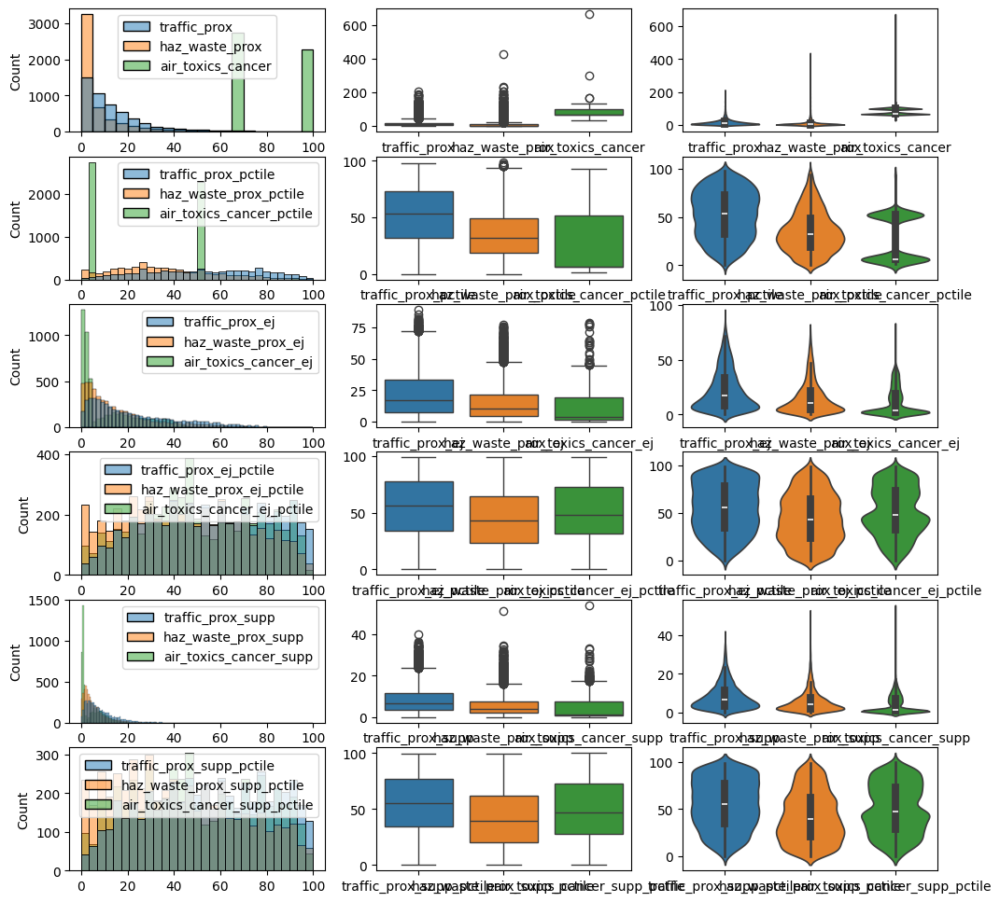

In [ ]:
import seaborn as sns

def append_suffix(orig_list,suffix):
  l=orig_list.copy()
  for i in range(0,len(l)):
    l[i]+=suffix
  return l



# Create subplots
fig, axes = plt.subplots(6, 3, figsize=(12, 12))

columns=[*EJScreen_columns_base_dict]
#columns=["haz_waste_prox_ej","traffic_prox_ej","air_toxics_cancer_ej"]

row=0
ejdf=df.loc[:,columns]*scalefactors
sns.histplot(data=ejdf, ax=axes[row][0], binrange=(0,100))
sns.boxplot(data=ejdf, ax=axes[row][1])
sns.violinplot(data=ejdf, ax=axes[row][2])

row+=1

#columns=append_suffix(columns,"_pctile")
ejdf=df.loc[:,append_suffix(columns,"_pctile")]
sns.histplot(data=ejdf, ax=axes[row][0], binrange=(0,100))
sns.boxplot(data=ejdf, ax=axes[row][1])
sns.violinplot(data=ejdf, ax=axes[row][2])

row+=1

#columns=["haz_waste_prox_ej","traffic_prox_ej","air_toxics_cancer_ej"]
ejdf=df.loc[:,append_suffix(columns,"_ej")]
sns.histplot(data=ejdf, ax=axes[row][0], binrange=(0,100))
sns.boxplot(data=ejdf, ax=axes[row][1])
sns.violinplot(data=ejdf, ax=axes[row][2])

row +=1

ejdf=df.loc[:,append_suffix(columns,"_ej_pctile")]
sns.histplot(data=ejdf, ax=axes[row][0], binrange=(0,100))
sns.boxplot(data=ejdf, ax=axes[row][1])
sns.violinplot(data=ejdf, ax=axes[row][2])

row +=1

#columns=["haz_waste_prox_supp","traffic_prox_supp","air_toxics_cancer_supp"]
ejdf=df.loc[:,append_suffix(columns,"_supp")]
sns.histplot(data=ejdf, ax=axes[row][0], binrange=(0,100))
sns.boxplot(data=ejdf, ax=axes[row][1])
sns.violinplot(data=ejdf, ax=axes[row][2])

row+=1

ejdf=df.loc[:,append_suffix(columns,"_supp_pctile")]
sns.histplot(data=ejdf, ax=axes[row][0], binrange=(0,100))
sns.boxplot(data=ejdf, ax=axes[row][1])
sns.violinplot(data=ejdf, ax=axes[row][2])

"""
# Rotate x-axis labels
ax=axes[1]
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("after cleanup")
"""
plt.show()

Ugh, what to make of the above?  I guess pctiles are easier to work with
TODO: try using "hue" column in histogram?

<Axes: xlabel='haz_waste_prox', ylabel='Percent'>

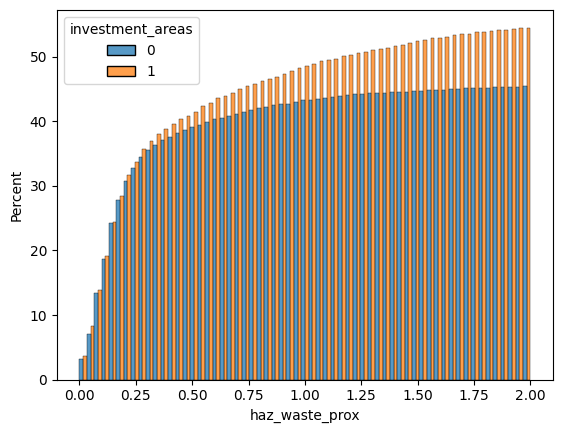

In [ ]:
dummydf=df.loc[:,["haz_waste_prox","haz_waste_prox_pctile","investment_areas"]]
dummydf["pctile_buckets"]=(dummydf["haz_waste_prox_pctile"]//20)*20

#dummydf["haz_waste_prox_pctile"].head()//20*20
#sns.histplot(data=dummydf,x="haz_waste_prox",hue="pctile_buckets",binrange=(0,2))
sns.histplot(data=dummydf,x="haz_waste_prox",hue="investment_areas",binrange=(0,2),multiple="dodge",cumulative=True,stat="percent")
#multiple : {"layer", "dodge", "stack", "fill"}
#sns.histplot(data=dummydf,x="haz_waste_prox",binrange=(0,2))
#sns.histplot
#dummydf.groupby("pctile_buckets").count()
#df.haz_waste_prox[df.haz_waste_prox>5].sort_values().round(-1)

<Axes: xlabel='haz_waste_prox', ylabel='Percent'>

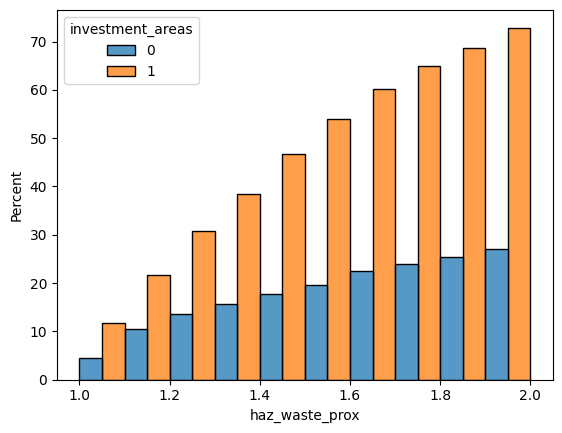

In [ ]:
sns.histplot(data=dummydf[df.haz_waste_prox>1],x="haz_waste_prox",hue="investment_areas",binrange=(1,2),multiple="dodge",cumulative=True,stat="percent")

<Axes: xlabel='haz_waste_prox', ylabel='Percent'>

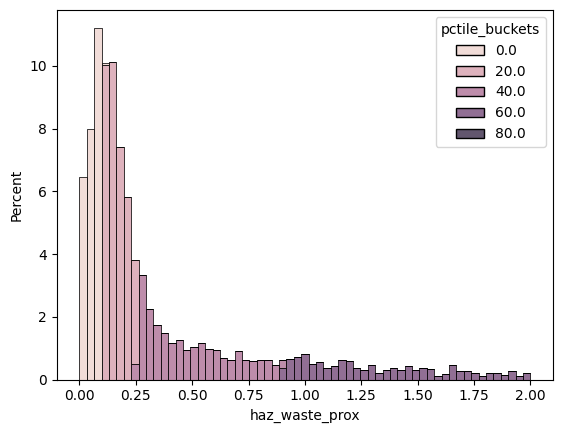

In [ ]:
sns.histplot(data=dummydf,x="haz_waste_prox",hue="pctile_buckets",binrange=(0,2),multiple="stack",stat="percent")

<Axes: xlabel='haz_waste_prox', ylabel='Percent'>

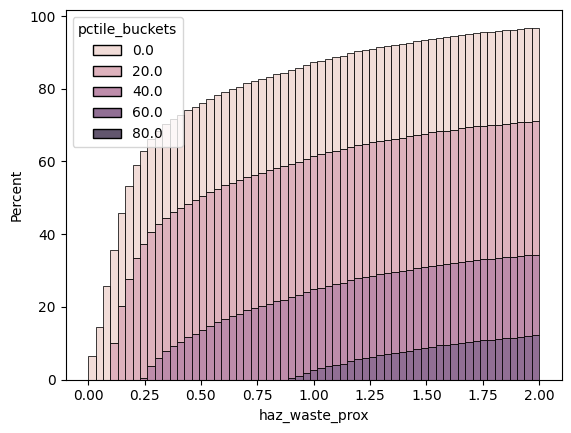

In [ ]:
sns.histplot(
    data=dummydf,
    x="haz_waste_prox",
    hue="pctile_buckets",
#    hue_order=["80.0","60.0","40.0","20.0","0.0"],
    binrange=(0,2),
    multiple="stack",
    cumulative=True,
    stat="percent")

In [ ]:
df.haz_waste_prox.quantile([0.05,0.1,0.2,0.3,0.5,0.7,0.8,0.9,0.95,0.97,0.99,1.0])

,haz_waste_prox
0.05,0.027152
0.10,0.048612
0.20,0.081425
0.30,0.112718
0.50,0.180657
0.70,0.355424
0.80,0.661612
0.90,1.304829
0.95,2.154620
0.97,2.812013


#### experiments with plotly violin and histogram plots

In [ ]:
# "share_of_properties_at_risk_of_flood_in_30_years"

pd.options.plotting.backend = "plotly"

col_renames={
    "flood_risk_30yr_share": "share_of_properties_at_risk_of_flood_in_30_years",
    "flood_risk_30yr_pctile": "share_of_properties_at_risk_of_flood_in_30_years_percentile",
}

dff=df.rename(columns=col_renames).loc[:,[
    "geoid",
    "share_of_properties_at_risk_of_flood_in_30_years",
    "share_of_properties_at_risk_of_flood_in_30_years_percentile",
    "investment_areas",
    "qct",
    "opzone"
    ]]

dff.plot.hist(y="share_of_properties_at_risk_of_flood_in_30_years_percentile",bins=10,histnorm='percent',marginal="violin", # can be 'rug', `box`, `violin`
              hover_data=dff.columns)

In [ ]:

#https://plotly.com/python/violin/


fig = px.violin(dff, y="share_of_properties_at_risk_of_flood_in_30_years", color="qct", box=True, points="all", violinmode='overlay',
          hover_data=dff.columns)

#fig.add_trace(px.violin(dff, y="share_of_properties_at_risk_of_flood_in_30_years", color="opzone", box=True, points="all", violinmode='overlay',
#          hover_data=dff.columns))

fig.show()

### Geospatial visualizations


This section is under construction!  Am using Folium to create interactive maps showing which government programs different census tracts belong to, filtered in arbitrary ways.  Also want to add layers for things like environmental hazards, racial composition etc

In [ ]:
# perhaps I should be using 2020 or 2022 data instead? Not sure
url="https://github.com/kodiakpony/datakit-housing-fall-2024/raw/refs/heads/main/challenge-3/FL/cb_2023_12_tract_500k.zip"
gdf = gpd.read_file(url)
gdf["geoid"]=gdf["GEOID"].astype(int)
gdf.set_index("geoid", inplace=True)

merged_gdf = gdf.merge(df2, on='geoid')
#merged_gdf.columns

In [ ]:

merged_gdf2=merged_gdf
merged_gdf2["geometry"] = merged_gdf2.centroid
#merged_gdf2=merged_gdf2.set_geometry("centroid")

#merged_gdf2.plot()
#merged_gdf2.head().T

<ipython-input-96-53214e759a61>:2: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [ ]:
merged_gdf.head().T

,0,1,2,3,4
geoid,12031013200,12031002901,12031012000,12031012900,12031015200
STATEFP,12,12,12,12,12
COUNTYFP,031,031,031,031,031
TRACTCE,013200,002901,012000,012900,015200
GEOIDFQ,1400000US12031013200,1400000US12031002901,1400000US12031012000,1400000US12031012900,1400000US12031015200
GEOID,12031013200,12031002901,12031012000,12031012900,12031015200
NAME,132,29.01,120,129,152
NAMELSAD,Census Tract 132,Census Tract 29.01,Census Tract 120,Census Tract 129,Census Tract 152
STUSPS,FL,FL,FL,FL,FL
NAMELSADCO,Duval County,Duval County,Duval County,Duval County,Duval County


In [ ]:
import folium


# @title This cell creates a Folium map with markers colored by gov program and filtered by query string, with tooltips and popups { run: "auto" }

filter_string = "county==31 and investment_areas==1" # @param ["county_name=='Marion County'", "investment_areas==0 and (opzone==1 or qct==1)", "county_fips_code==31 and investment_areas==1"] {allow-input: true}
#filter_string="NAMELSADCO=='Marion County'"
#filter_string="investment_areas==0 and (opzone==1 or qct==1)" #county==31" # and investment_areas==1"
# let's try using GeoJSON instead of chloropleth
#filter_string = "opzone==1 and qct==1 and county==31"

merged_gdf = gdf.merge(df2, on='geoid')
#merged_gdf = gdf.merge(data, on='unique_id_column')

# Create a base map
#ctr=merged_gdf.geometry.centroid
#center_latitude=(ctr.y.max()+ctr.y.min())/2
#center_longitude=(ctr.x.max()+ctr.x.min())/2
#center_longitude=(merged_gdf.geometry.centroid.x.mean()
m = folium.Map(#location=[center_latitude, center_longitude],
#               zoom_start=7,
               min_zoom=6,
               tiles="cartodb positron"
               )

popup = folium.GeoJsonPopup(
    fields=["NAMELSADCO", "NAMELSAD", "opzone", "qct", "investment_areas"],
    aliases=["County:", "Tract:", "is HUD Opporunity Zone:", "Is HUD Qualified Census Tract:","is Investment Area:"],
#    fields=["county", "opzone", "qct", "investment_areas"],
#    aliases=["County:", "is HUD Opporunity Zone:", "Is HUD Qualified Census Tract:","is Investment Area:"],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)


tooltip = folium.GeoJsonTooltip(
    fields=["NAMELSADCO", "NAMELSAD", "opzone", "qct", "investment_areas"],
    aliases=["County:", "Tract:", "is HUD Opporunity Zone:", "Is HUD Qualified Census Tract:","is Investment Area:"],
#    fields=["county", "opzone", "qct", "investment_areas"],
#    aliases=["County:", "is HUD Opporunity Zone:", "Is HUD Qualified Census Tract:","is Investment Area:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)

# style_function parameters: https://leafletjs.com/reference.html#path-option


#You can use: ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen',
# 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray'] i
# con_color (str, default 'white') – The color of the drawing on the marker.


merged_gdf2=merged_gdf.query(filter_string)
merged_gdf2["geometry"] = merged_gdf2.centroid
#merged_gdf2["geometry"] = merged_gdf2.centroid
#merged_gdf2=merged_gdf2.set_geometry("centroid")
folium.GeoJson(
    merged_gdf2,
    zoom_start=7,
    min_zoom=7,

#    marker=folium.CircleMarker(radius=4, fill_color="orange", fill_opacity=0.4, color="orange", weight=1),
    marker=folium.Marker(icon=folium.Icon(icon='star')),
#    marker=folium.Marker(),
    style_function=lambda feature: {
      "fillColor": "green"
      if feature["properties"]["opzone"]==1
      else "#ffff00",
      "color": "green"
      if feature["properties"]["opzone"]==1
      else "#ffff00",
      "markerIcon": "info-sign",
      "markerIconColor": "green",
      "markerColor": "lightgray"
      if feature["properties"]["opzone"]==0 and feature["properties"]["qct"]==0 and feature["properties"]["investment_areas"]==0
      else (
        "beige" if feature["properties"]["opzone"]==0 and feature["properties"]["qct"]==0 and feature["properties"]["investment_areas"]==1
        else (
            "purple" if feature["properties"]["opzone"]==1 and feature["properties"]["qct"]==1 and feature["properties"]["investment_areas"]==1
            else (
                "blue" if feature["properties"]["opzone"]==1 and feature["properties"]["qct"]==0 and feature["properties"]["investment_areas"]==1
                else (
                    "green" if feature["properties"]["opzone"]==0 and feature["properties"]["qct"]==1 and feature["properties"]["investment_areas"]==1
                    else (
                        "darkpurple" if feature["properties"]["opzone"]==1 and feature["properties"]["qct"]==1 and feature["properties"]["investment_areas"]==0
                        else (
                            "darkblue" if feature["properties"]["opzone"]==1 and feature["properties"]["qct"]==0 and feature["properties"]["investment_areas"]==0
                            else (
                                "darkgreen" if feature["properties"]["opzone"]==0 and feature["properties"]["qct"]==1 and feature["properties"]["investment_areas"]==0
                                else "red"
                            )
                        )
                    )
                )
            )
        )
      ),

#      else "blue",
#      if feature["properties"]["investment_areas"]==1 and feature["properties"]["qct"]==0 and feature["properties"]["opzone"]==0

 #     "show": True
 #     if feature["properties"]["opzone"]==1
 #     else False,
#      "show": False,
      "weight": 1,
      "radius": 4,
#      "markerOpacity": 0.2,
#      "fillOpacity": 0.2,
#      "dashArray": "5, 5",
    },
#    style_function=lambda x: {
#        "fillColor": colors[x['properties']['service_level']],
#        "radius": (x['properties']['lines_served'])*30,
#    },
    popup_keep_highlighted=True,
    highlight_function=lambda x: {"fillOpacity": 0.8},
#    highlight=True,  # highlight doesn't seem to exist, but highlight_function and popup_keep_highlighted do
    tooltip=tooltip,
    popup=popup,
    zoom_on_click=True,
    #      if "e" in feature["properties"]["NAMELSADCO"].lower()
).add_to(m)

# Add a layer control
folium.LayerControl().add_to(m)

# Pan and Zoom map starting position to include overlays
folium.FitOverlays().add_to(m)

# Display the map
m



<ipython-input-98-4464a26dbb2f>:63: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
#@title This creates a Folium Chloropleth map with a layer per government housing program, no popups
import folium

# Load GeoDataFrame
#gdf = gpd.read_file('your_geospatial_data.geojson')

# Load data
#data = pd.read_csv('your_data.csv')

merged_gdf = gdf.merge(df2, on='geoid')
#merged_gdf = gdf.merge(data, on='unique_id_column')

# Create a base map
ctr=merged_gdf.geometry.centroid
center_latitude=(ctr.y.max()+ctr.y.min())/2
center_longitude=(ctr.x.max()+ctr.x.min())/2
#center_longitude=(merged_gdf.geometry.centroid.x.mean()
m = folium.Map(location=[center_latitude, center_longitude],
               zoom_start=7,
               min_zoom=7,
               tiles="cartodb positron"
               )
#m=folium.Map()

# Create the Investment Areas choropleth layer
folium.Choropleth(
    geo_data=merged_gdf[merged_gdf.investment_areas==1],
    name='Investment Areas',
    fill_color='#aaaaff',
    fill_opacity=0.5,
    line_opacity=0.2,
    highlight=True,

#    legend_name='Investment Areas'
).add_to(m)

# Create the HUD Qualfied Census Tract choropleth layer
folium.Choropleth(
    geo_data=merged_gdf[merged_gdf.qct==1],
    name='HUD Qualified Census Tracts',
#    data=merged_gdf[merged_gdf.qct==1],
 #   columns=['unique_id_column', 'value_column'],
#    columns=['geoid','qct'],
#    key_on='feature.properties.geoid',
#    fill_color='YlGnBu',
    fill_color="red",
    fill_opacity=0.5,
    line_opacity=0.2,
    highlight=True,
    legend_name='Qualified Census Tracts'
).add_to(m)


# Create the HUD opportunity zones choropleth layer
folium.Choropleth(
    geo_data=merged_gdf[merged_gdf.opzone==1],
    name='HUD Opportunity Zones',
    fill_color='yellow',
    fill_opacity=0.5,
    line_opacity=0.2,
    highlight=True,
    legend_name='Opzone',

).add_to(m)


# Add a layer control
folium.LayerControl().add_to(m)

# Display the map
m


<ipython-input-99-7f2a95f1bd82>:14: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




### The mystery of the missing geoids

Uh-oh!   There is a mystery here.  My GeoDataFrame only has 1596 investment_areas, but my original dataframe had 1605.  I think that means there are some geoids in the original dataframe that don't appear in my geo one.  Maybe that's because I got my data from 2023?  Need to sort this out, but am ignoring for now.  

I did confirm that none of these missing geoids are investment areas, qcts, in economic distress etc

**DOH! It turned out the missing geoids were a mistake in the initial dataset provided byDataKind folks. Will see what happens when get an updated dataset.**

In [ ]:
df2.describe()

,geoid,county,opzone,investment_areas,qct,economic_distress_pop_agg,total_cdfi_lending,total_pop,total_households
count,5.160000e+03,5160.000000,5160.000000,5160.000000,5160.000000,5160.000000,5.036000e+03,5160.000000,5160.000000
mean,1.207178e+10,71.692442,0.098837,0.545349,0.177713,0.289147,4.863052e+05,4174.067248,1652.919961
std,3.595191e+07,35.938525,0.298472,0.497987,0.382308,0.453410,1.570934e+06,2016.459448,751.449755
min,1.200100e+10,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
25%,1.203902e+10,39.000000,0.000000,0.000000,0.000000,0.000000,4.940925e+04,2821.000000,1153.750000
50%,1.208600e+10,86.000000,0.000000,1.000000,0.000000,0.000000,1.357727e+05,3912.000000,1570.500000
75%,1.209901e+10,99.000000,0.000000,1.000000,0.000000,1.000000,3.908514e+05,5234.000000,2066.250000
max,1.213397e+10,133.000000,1.000000,1.000000,1.000000,1.000000,3.807847e+07,22780.000000,7633.000000


#Appendix


## TODO

* can I filter the set of markers shown in Folium Map, still using a dataframe?  If so, filter by Government program, county, freeform?
* decide whether I want separate layers per government program (can I make programs translucent?  depends a bit on answer to filtering question
* figure out how to show plots in a popup / separate pane based on selected geoid
* experiment with coloring markers by flood risk / other environmental hazards
* figure out how to make histograms overlaid with value for particular geoid. Or just show percentile of geoid relative to others?
* decide which things I want to have as markers vs polygons vs boundaries

### Interactive plots

From AI summary:

Choosing the right option:

For quick interactive plots: Use the Plotly backend.
looks nice!
https://plotly.com/python/basic-charts/


For a visual interface: Use PandasGUI.

For custom interactivity: Use Matplotlib and ipywidgets.

For advanced visualizations: Use Altair.

In [ ]:
import pandas as pd
pd.options.plotting.backend = "plotly"

df = pd.DataFrame({'x': [1, 2, 3], 'y': [4, 5, 6]})
df.plot(kind='scatter', x='x', y='y')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import interact

df = pd.DataFrame({'x': [1, 2, 3], 'y': [4, 5, 6]})

@interact(kind=['line', 'bar', 'scatter'])
def plot_df(kind):
    df.plot(kind=kind)
    plt.show()

interactive(children=(Dropdown(description='kind', options=('line', 'bar', 'scatter'), value='line'), Output()…

## Newbie notes


data dictionary:
https://eodatascape.datakind.org/data-dictionary


CDFI info:
https://www.cdfifund.gov/faq#:~:text=While%20the%20CDFI%20Fund%20does,you%20in%20the%20right%20direction.

https://cdfi.org/what-are-cdfis/

https://cimsprodprep.cdfifund.gov/CIMS4/apps/pn-cdfi/index.aspx#?entity=STATE,12&center=-83.804605,27.748685&level=7&tool=result&visible=CT_2020_CDFI,STATE

https://www.cdfifund.gov/cims

EODataScape's source dataset for CDFI lending (the CDFI Transaction Level Report):
https://www.cdfifund.gov/sites/cdfi/files/2023-07/FY2021_Data_Documentation_Instruction.zip

Some nice examples of interactive tools looking at similar data:

 https://www.cdfifund.gov/cims

https://cimsprodprep.cdfifund.gov/CIMS4/apps/pn-cdfi/index.aspx#?center=-98.299891,38.724&level=4&tool=result&visible=CT_2020_CDFI

https://www.energy.gov/scep/slsc/lead-tool
https://justice40.cnt.org/
both use MapBox
MapBox vs GoogleMaps:
https://medium.com/@support_74363/mapbox-vs-google-maps-what-are-the-differences-web-developers-leicester-49518132c40b#:~:text=The%20quality%20of%20geographic%20data,terms%20of%20accuracy%20and%20coverage.

methodology for flood risk columns
https://screeningtool.geoplatform.gov/en/methodology#flood-risk

Some useful references for python zip file csv reading:

https://docs.python.org/3/library/zipfile.html

https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html

https://www.geeksforgeeks.org/with-statement-in-python/

other basic Python things:

https://www.geeksforgeeks.org/python-get-dictionary-keys-as-a-list/

https://docs.kanaries.net/articles/plotly-vs-matplotlib

Useful resource for plotting Venn diagrams: https://www.geeksforgeeks.org/how-to-create-and-customize-venn-diagrams-in-python/#

Am currently trying to find a map of census tracts to load to be able to visualize data geographically.

Have spent way too long trying to figure this out! I think the right place to get data is from census.gov. I found a useful description of geoids here:

https://www.census.gov/programs-surveys/geography/guidance/geo-identifiers.html

and a way to download TIGER files here:

https://www.census.gov/geographies/mapping-files/time-series/geo/cartographic-boundary.html

https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.html


and some promising looking tutorials and Q&A here:

https://geopandas.org/en/stable/getting_started/introduction.html

https://medium.com/@jl_ruiz/plot-maps-from-the-us-census-bureau-using-geopandas-and-contextily-in-python-df787647ef77

https://stackoverflow.com/questions/76369026/how-to-access-us-census-tiger-shapefiles-in-geopandas

https://www.natekratzer.com/posts/census_map/

So hopefully between those and the example someone else already did for DataKit, I can figure this out! Still plugging away, though.

Dealing with GIT:

https://docs.github.com/en/pull-requests/collaborating-with-pull-requests/proposing-changes-to-your-work-with-pull-requests/creating-a-pull-request

GIS software:

https://gisgeography.com/arcgis-pro-vs-qgis-3/
https://gisgeography.com/qgis2web/
https://gisgeography.com/web-mapping/
https://gisgeography.com/qgis-cloud/
https://gisgeography.com/gis-programming-tutorials/

GeoPandas:
https://github.com/tobah59x/GeoPandasCPJ


Folium:

https://python-visualization.github.io/folium/latest/user_guide/geojson/choropleth.html
https://python-visualization.github.io/folium/latest/reference.html
https://python-visualization.github.io/folium/latest/reference.html#module-folium.features

https://leaflet-extras.github.io/leaflet-providers/preview/
https://medium.com/datasciencearth/map-visualization-with-folium-d1403771717

https://python-visualization.github.io/folium/latest/advanced_guide/colormaps.html
https://python-visualization.github.io/folium/latest/user_guide/geojson/geopandas_and_geo_interface.html

https://github.com/datakind/datakit-housing-fall-2024/blob/main/challenge-4/racehd/FL-disaster-vulnerabilities.ipynb


Supported marker colors:
You can use: ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray'] icon_color (str, default 'white') – The color of the drawing on the marker.


Hacktoberfest:

https://hacktoberfest.com/profile/

Plotly interactive charts:

https://plotly.com/python/basic-charts/
Radar charts and violin charts seem cool.
https://plotly.com/python/radar-chart/


Manual inputs to Notebook via dropdowns, text boxes etc forcing recompute:

https://colab.research.google.com/notebooks/forms.ipynb

Looks like need to use IPWidgets to have dropdown with list of entries created at runtime (e.g. counties in Florida based on dataset).
With Google Forms it looks like changing value forces cell to recompute if you have something like this in the cell:

# @title After running this cell manually, it will auto-run if you change the selected value. { run: "auto" }

 Not sure if can get the same with IPWidgets. Doing the same thing doesn't work for IPWidgets. Also not sure if there is a way to get multiple cells to recompute


